In [56]:
pip install igraph


     ---------------------------------------- 2.8/2.8 MB 11.9 MB/s eta 0:00:00
  Using cached texttable-1.6.4-py2.py3-none-any.whl (10 kB)


You should consider upgrading via the 'C:\Users\KKo1\Anaconda3\envs\py38\python.exe -m pip install --upgrade pip' command.


In [58]:
pip install louvain


  Using cached louvain-0.7.1-cp39-cp39-win_amd64.whl (94 kB)


You should consider upgrading via the 'C:\Users\KKo1\Anaconda3\envs\py38\python.exe -m pip install --upgrade pip' command.


In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
from numpy import linalg as la
from scipy.sparse import issparse
import loompy
import anndata
import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.5 (python 3.8.16) on 2023-06-05 12:43.


In [27]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white')

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.5


In [3]:
import os
os.chdir('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4')

In [4]:
import scanpy.external as sce

In [29]:
from matplotlib import pyplot as plt
plt.rcParams["axes.grid"] = False

# CD45- cells (previously annotated as epithelial cells or tumor cells)

In [5]:
adata_epi = sc.read('epithelial_cells_from_script7.h5ad')

In [10]:
adata = adata_epi

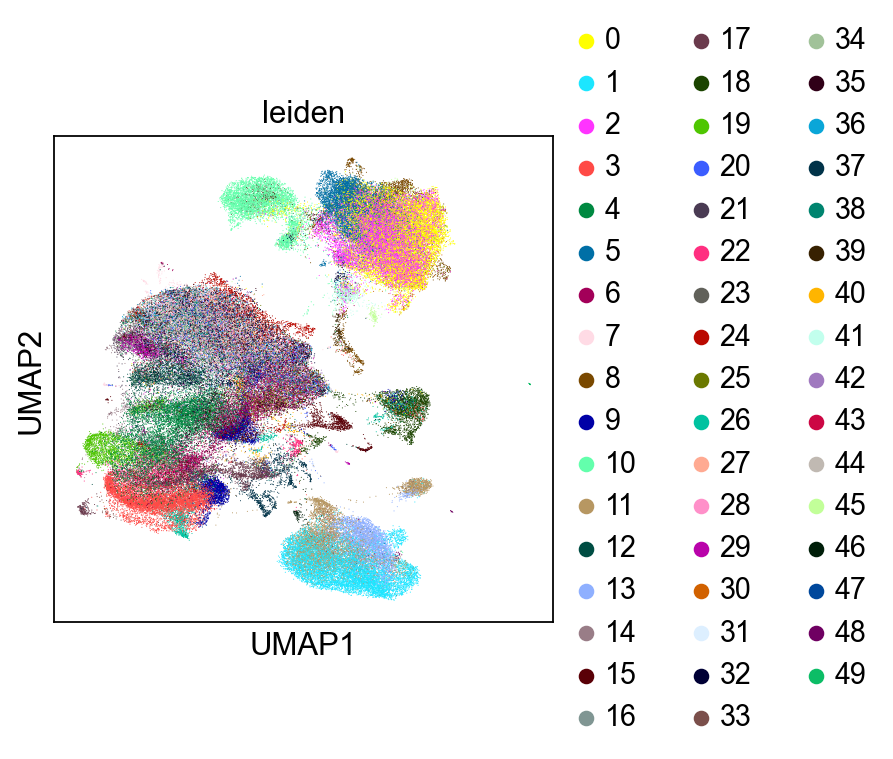

In [11]:
sc.pl.umap(adata, color=["leiden"])

In [12]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
sc.tl.leiden(adata)

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:44:22)
computing PCA
    with n_comps=50
    finished (0:00:59)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:23)
running Leiden clustering
    finished: found 48 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:49)


TypeError: umap() got an unexpected keyword argument 'color'

In [13]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:54)


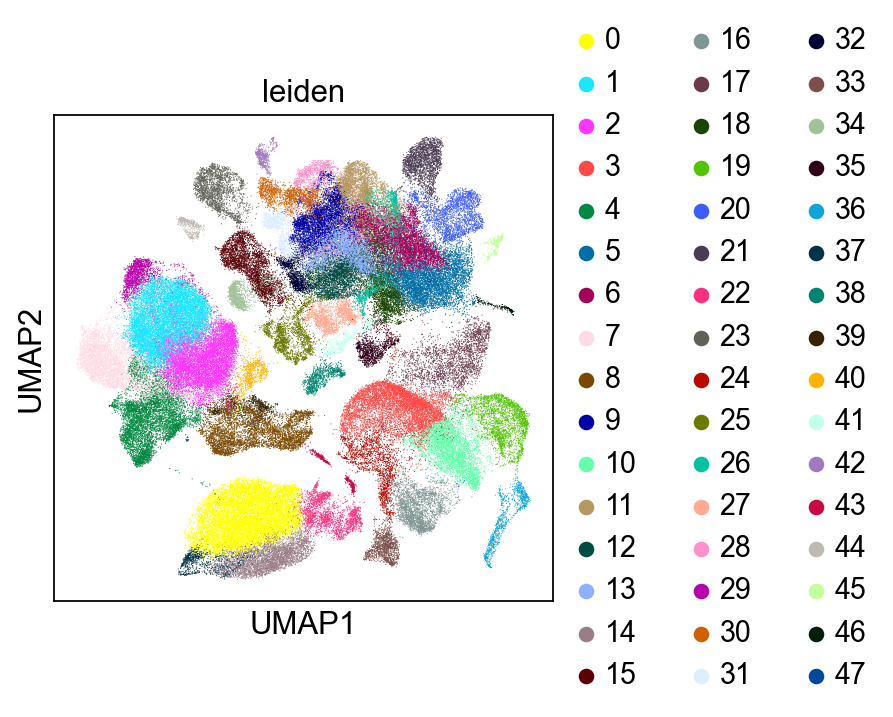

In [14]:
sc.pl.umap(adata, color=['leiden'])

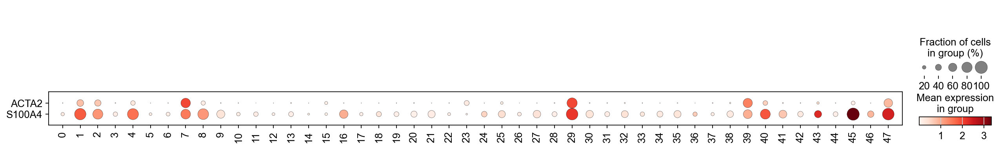

In [17]:
sc.pl.dotplot(adata, ['ACTA2','S100A4'], groupby=['leiden'], swap_axes=True)

In [100]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Tumor': ['0','3','5','6','9','10','11','12','13','14','15','16','17','18','19','20',
                      '21','22','23','24','25','26','27','28','30',
                      '31','32','33','34','35','36','37','38',
                      '41','42','43','44','45','46'],
             'Fibroblast': ['1','2','4','7','8','29','39','40','47']
             
            }

# Initialize empty column in cell metadata
adata.obs['crude'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs.leiden).isin(cell_dict[i])
    adata.obs.loc[ind,'crude'] = i

In [101]:
adata.obs['crude']

AAACCTGAGCTAAACA-1-0-0-0     Fibroblast
AAACCTGAGCTGCAAG-1-0-0-0          Tumor
AAACCTGAGTACGTAA-1-0-0-0     Fibroblast
AAACCTGCACTGAAGG-1-0-0-0          Tumor
AAACCTGGTGCACCAC-1-0-0-0          Tumor
                                ...    
TTTGTCACAAGACGTG-1-60-0-2         Tumor
TTTGTCACAGGTCTCG-1-60-0-2         Tumor
TTTGTCAGTAGCGCTC-1-60-0-2         Tumor
TTTGTCATCGACCAGC-1-60-0-2         Tumor
TTTGTCATCGAGAGCA-1-60-0-2         Tumor
Name: crude, Length: 138849, dtype: object

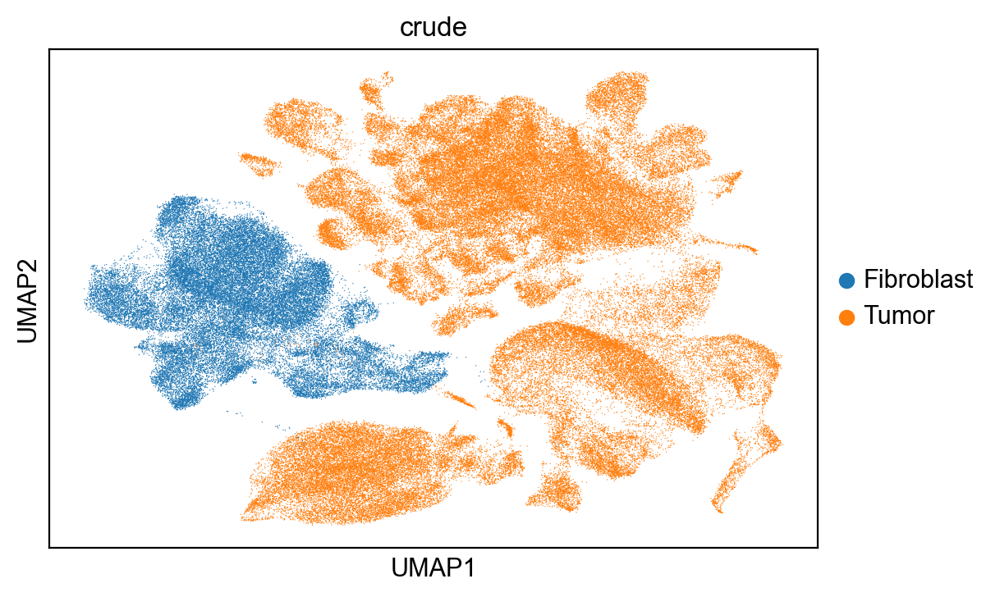

In [102]:
sc.pl.umap(adata, color=['crude'])

In [103]:
adata.write('epi_and_fibro_06-02-2023.h5ad', compression='gzip')

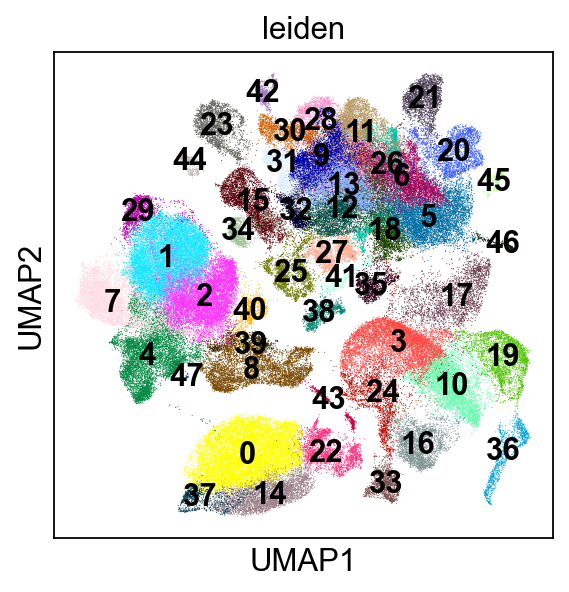

In [20]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data')

In [21]:
adata_CAF = adata[adata.obs['leiden'].isin(['1','2','4','7','8','29','39','40','47'])]
adata_CAF

View of AnnData object with n_obs × n_vars = 38527 × 11060
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'source', 'patient_cluster', 'Notch_score', 'Tp53_score', 'Cdkn2a_score', 'NFkB_score', 'GOBP_tgfb_score', 'GOBP_notch_score', 'GOBP_wnt_score', 'GOBP_hippo_score', 'GOBP_cellcycle_score', 'GOBP_histone_score', 'GOBP_pi3k_score', 'celltype', 'crude', 'celltype_detail', 'dataset', 'T_patient_cluster4', 'Myeloid_patient_cluster4', 'Myeloid_to_T_cluster44'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_cells_by_counts-1-0', 'mean_counts-1-0', 'pct_dropout_by_counts-1-0', 'total_counts-1-0', 'n_cells-10-0', 'n_cells_by_counts-10-0', 'mean_counts-10-0', 'pct_dropou

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_patient']`


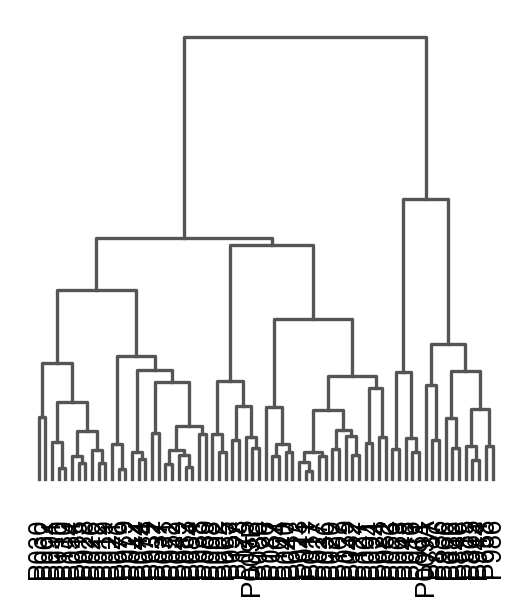

<Axes: >

In [22]:
# dendrogram after converting mouse gene to human gene
sc.tl.dendrogram(adata_CAF, 'patient')
sc.pl.dendrogram(adata_CAF, 'patient')

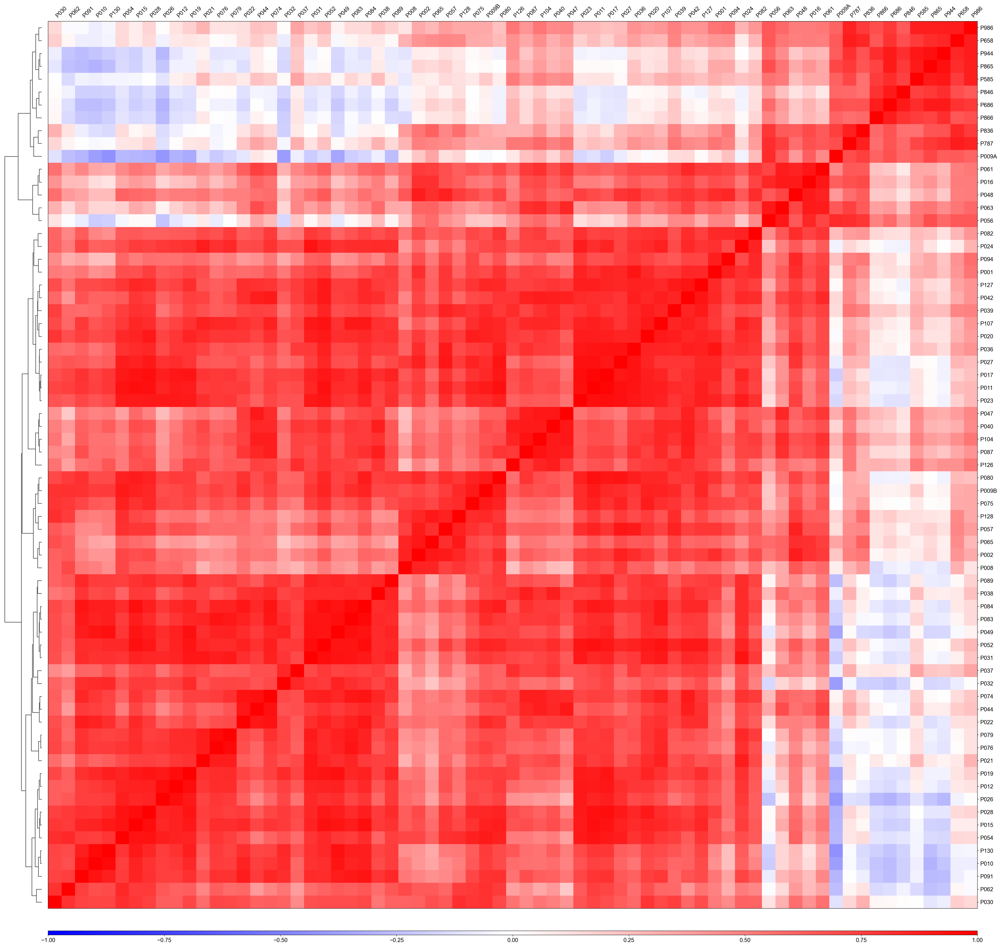

In [30]:
sc.pl.correlation_matrix(adata_CAF, groupby='patient')

In [24]:
#############################################################
############ Harmony batch correction #######################
#############################################################

sce.pp.harmony_integrate(adata_CAF, 'batch')
'X_pca_harmony' in adata_CAF.obsm
True

2023-06-05 14:00:22,701 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-06-05 14:00:57,086 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-06-05 14:00:57,436 - harmonypy - INFO - Iteration 1 of 10
2023-06-05 14:01:23,796 - harmonypy - INFO - Iteration 2 of 10
2023-06-05 14:01:50,057 - harmonypy - INFO - Iteration 3 of 10
2023-06-05 14:02:16,827 - harmonypy - INFO - Iteration 4 of 10
2023-06-05 14:02:43,167 - harmonypy - INFO - Iteration 5 of 10
2023-06-05 14:03:09,490 - harmonypy - INFO - Iteration 6 of 10
2023-06-05 14:03:32,585 - harmonypy - INFO - Iteration 7 of 10
2023-06-05 14:03:54,493 - harmonypy - INFO - Converged after 7 iterations


True

In [25]:
adata_CAF.obsm['X_pca'] = adata_CAF.obsm['X_pca_harmony']
sc.pp.neighbors(adata_CAF)
sc.tl.pca(adata_CAF)
sc.tl.umap(adata_CAF)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing PCA
    with n_comps=50
    finished (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:32)


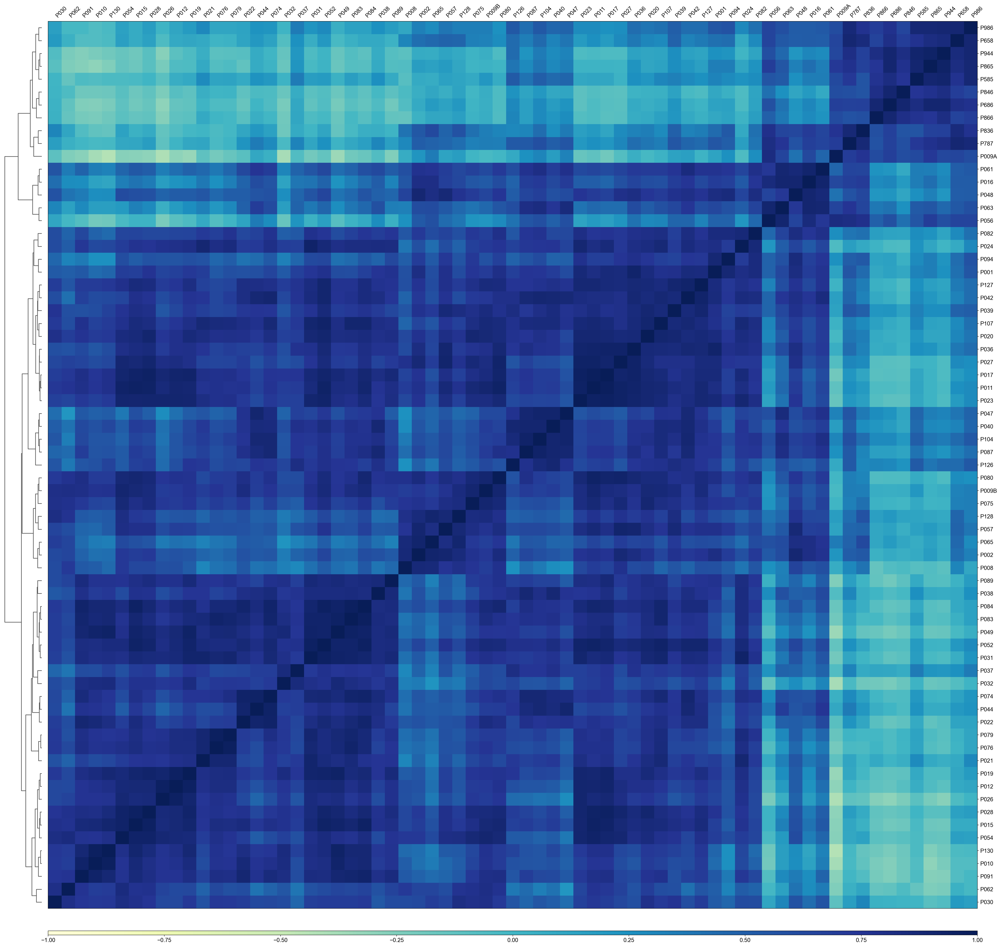

In [31]:
sc.pl.correlation_matrix(adata_CAF, groupby='patient',cmap='YlGnBu', save='_CAF_cell_GroupABC_correlation_matrix.pdf')

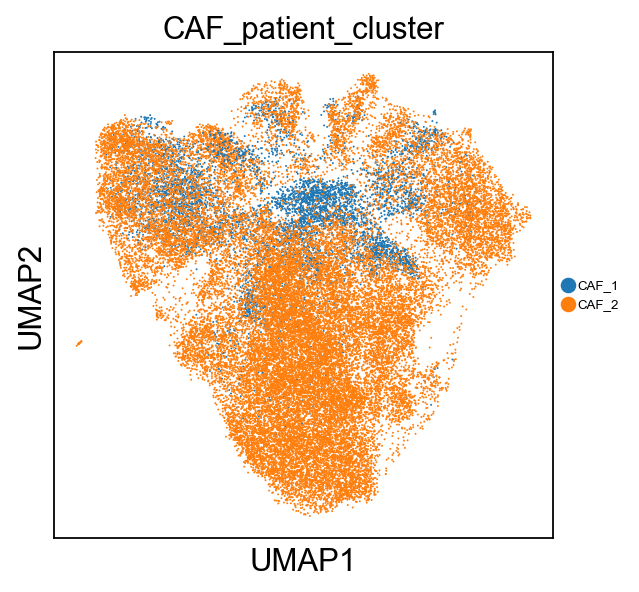

In [33]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'CAF_1': ['P986','P658','P944','P865','P585','P846','P686','P866','P836','P787',
                     'P009A','P061','P016','P048','P063','P056'],
             'CAF_2': ['P082','P024','P094','P001','P127','P042','P039','P107','P020','P036',
                     'P027','P017','P011','P023','P047','P040','P104','P087','P126','P080',
                     'P009B','P075','P128','P057','P065','P002','P008','P089','P038','P084','P083','P049','P052','P031',
                       'P037','P032','P074',
                      'P044','P022','P079','P076','P021','P019','P012','P026','P028','P015','P054','P130','P010','P091',
                       'P062','P030']
              }

# Initialize empty column in cell metadata
adata_CAF.obs['CAF_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_CAF.obs.patient).isin(cell_dict[i])
    adata_CAF.obs.loc[ind,'CAF_patient_cluster'] = i

sc.pl.umap(adata_CAF, color=['CAF_patient_cluster'], legend_loc='right margin', legend_fontsize=6, save='_CAF_patient_cluster.pdf')


In [34]:
adata_CAF.write('CAF_from_69ESCC.h5ad', compression='gzip')

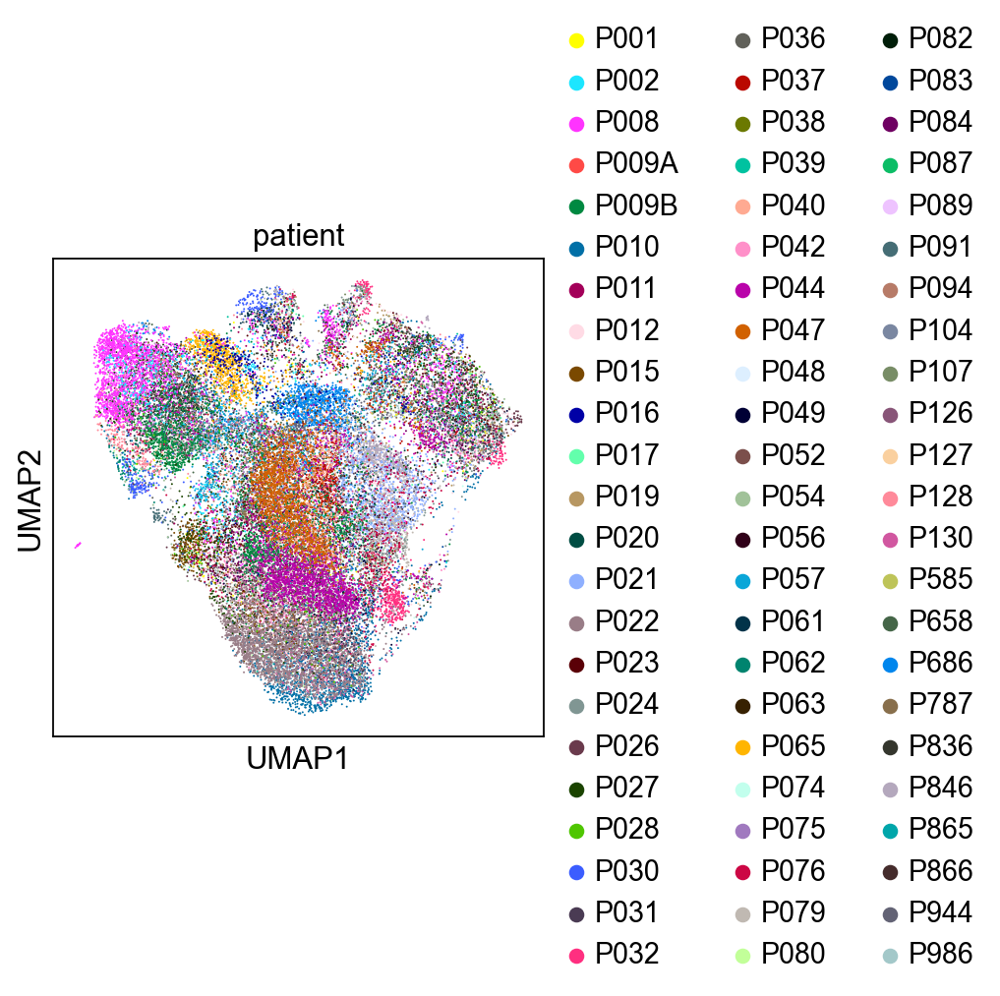

In [35]:
sc.pl.umap(adata_CAF, color=['patient'], save='_CAF_by_patient.pdf')

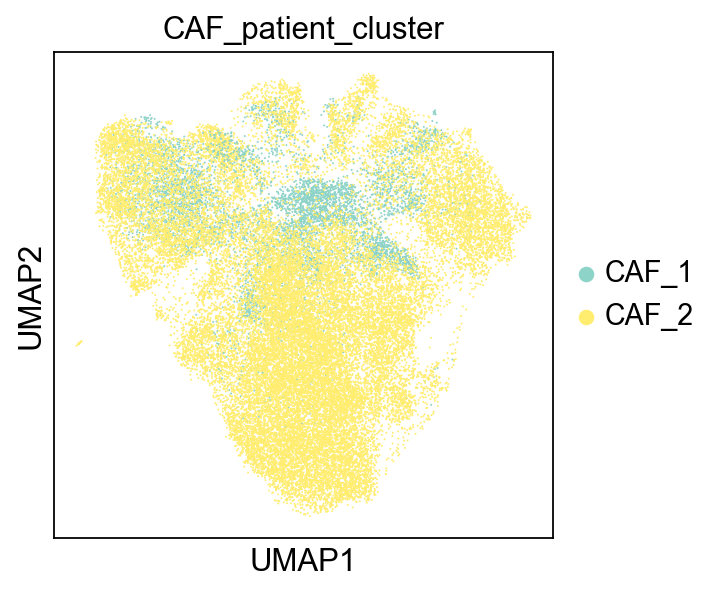

In [42]:
sc.pl.umap(adata_CAF, color=['CAF_patient_cluster'], palette='Set3', save='CAF_cluster_in_CAF_cell.pdf')

In [44]:
df_7 = pd.crosstab(adata_CAF.obs['patient'],adata_CAF.obs['patient_cluster'], normalize='index')
df_7

patient_cluster,Group A,Group B,Group C
patient,,,
P001,1.0,0.0,0.0
P002,0.0,0.0,1.0
P008,0.0,1.0,0.0
P009A,1.0,0.0,0.0
P009B,0.0,1.0,0.0
...,...,...,...
P846,1.0,0.0,0.0
P865,1.0,0.0,0.0
P866,1.0,0.0,0.0


In [45]:
df_8 = pd.crosstab(adata_CAF.obs['patient'],adata_CAF.obs['T_patient_cluster4'], normalize='index')
df_8

T_patient_cluster4,T_1,T_2,T_3,T_4
patient,,,,
P001,1.0,0.0,0.0,0.0
P002,0.0,1.0,0.0,0.0
P008,1.0,0.0,0.0,0.0
P009A,0.0,0.0,0.0,1.0
P009B,0.0,0.0,0.0,1.0
...,...,...,...,...
P846,0.0,0.0,1.0,0.0
P865,0.0,0.0,1.0,0.0
P866,0.0,0.0,1.0,0.0


In [46]:
df_9 = pd.crosstab(adata_CAF.obs['patient'],adata_CAF.obs['Myeloid_patient_cluster4'], normalize='index')
df_9

Myeloid_patient_cluster4,Myeloid_1,Myeloid_2,Myeloid_3,Myeloid_4
patient,,,,
P001,0.0,0.0,1.0,0.0
P002,0.0,0.0,1.0,0.0
P008,0.0,0.0,1.0,0.0
P009B,1.0,0.0,0.0,0.0
P010,0.0,1.0,0.0,0.0
...,...,...,...,...
P846,0.0,1.0,0.0,0.0
P865,0.0,1.0,0.0,0.0
P866,0.0,1.0,0.0,0.0


In [47]:
df_10 = pd.crosstab(adata_CAF.obs['patient'],adata_CAF.obs['CAF_patient_cluster'], normalize='index')
df_10

CAF_patient_cluster,CAF_1,CAF_2
patient,,
P001,0.0,1.0
P002,0.0,1.0
P008,0.0,1.0
P009A,1.0,0.0
P009B,0.0,1.0
...,...,...
P846,1.0,0.0
P865,1.0,0.0
P866,1.0,0.0


In [48]:
df_11 = pd.concat([df_7,df_8, df_9, df_10], axis=1)
df_11

,Group A,Group B,Group C,T_1,T_2,T_3,T_4,Myeloid_1,Myeloid_2,Myeloid_3,Myeloid_4,CAF_1,CAF_2
patient,,,,,,,,,,,,,
P001,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
P002,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
P008,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
P009A,1.0,0.0,0.0,0.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,1.0,0.0
P009B,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
P846,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
P865,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
P866,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [49]:
df_11.to_csv('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/patient_T_Myeloid_CAF_groups.csv')

# Sankey plot with CAF cells only

In [50]:
df = pd.DataFrame(adata_CAF.obs)
df

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,GOBP_histone_score,GOBP_pi3k_score,celltype,crude,celltype_detail,dataset,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44,CAF_patient_cluster
AAACCTGAGCTAAACA-1-0-0-0,2747.0,2630,1283.869751,19.201120,1.495566,tumor,P686,8,0,161.193115,...,-0.045633,0.042776,epithelial,epithelial,epithelial,NaN,T_3,Myeloid_2,M2toT3,CAF_1
AAACCTGAGTACGTAA-1-0-0-0,366.0,354,642.963806,39.510632,6.145079,tumor,P686,8,0,109.494339,...,0.036140,0.036661,epithelial,epithelial,epithelial,NaN,T_3,Myeloid_2,M2toT3,CAF_1
AAACCTGGTTATCGGT-1-0-0-0,2244.0,2184,1371.731934,17.751337,1.294082,tumor,P686,8,0,162.708511,...,0.002655,0.025256,epithelial,epithelial,epithelial,NaN,T_3,Myeloid_2,M2toT3,CAF_1
AAACGGGAGATCACGG-1-0-0-0,2412.0,2354,1387.585327,20.255865,1.459792,tumor,P686,8,0,157.249588,...,-0.038414,-0.031600,epithelial,epithelial,epithelial,NaN,T_3,Myeloid_2,M2toT3,CAF_1
AAACGGGAGGACGAAA-1-0-0-0,768.0,743,1054.984863,22.025494,2.087754,tumor,P686,8,0,141.616272,...,0.012251,-0.022008,epithelial,epithelial,epithelial,NaN,T_3,Myeloid_2,M2toT3,CAF_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGGCAACAATGAATG-1-60-0-2,NaN,3021,2398.471924,32.578518,1.358303,tumor,P079,1,2,176.526535,...,-0.034615,0.010517,epithelial,epithelial,epithelial,NaN,T_2,Myeloid_3,M3toT2,CAF_2
TTGTAGGAGGATGGAA-1-60-0-2,NaN,4042,2240.749512,32.112530,1.433116,tumor,P079,1,2,180.837570,...,-0.073043,0.015650,epithelial,epithelial,epithelial,NaN,T_2,Myeloid_3,M3toT2,CAF_2
TTTACTGAGGTGCTAG-1-60-0-2,NaN,2765,2507.720947,33.121029,1.320762,tumor,P079,1,2,159.305267,...,-0.000514,-0.002541,epithelial,epithelial,epithelial,NaN,T_2,Myeloid_3,M3toT2,CAF_2
TTTACTGTCCGTAGGC-1-60-0-2,NaN,1310,1971.560547,50.863678,2.579869,tumor,P079,2,2,116.986420,...,0.022337,0.064481,epithelial,epithelial,epithelial,NaN,T_2,Myeloid_3,M3toT2,CAF_2


In [51]:
print (df.dtypes)

n_genes                      float64
n_genes_by_counts              int32
total_counts                 float32
total_counts_mt              float32
pct_counts_mt                float32
tissue                      category
patient                     category
leiden                      category
batch                       category
total_counts_ribo            float32
pct_counts_ribo              float32
total_counts_hb              float32
pct_counts_hb                float32
percent_mt2                  float32
n_counts                     float32
source                      category
patient_cluster             category
Notch_score                  float64
Tp53_score                   float64
Cdkn2a_score                 float64
NFkB_score                   float64
GOBP_tgfb_score              float64
GOBP_notch_score             float64
GOBP_wnt_score               float64
GOBP_hippo_score             float64
GOBP_cellcycle_score         float64
GOBP_histone_score           float64
G

In [53]:
df['patient'] = df['patient'].astype(object)
df['crude'] = df['crude'].astype(object)
df['leiden'] = df['leiden'].astype(object)
df['patient_cluster'] = df['patient_cluster'].astype(object)
df['T_patient_cluster4'] = df['T_patient_cluster4'].astype(object)
df['CAF_patient_cluster'] = df['CAF_patient_cluster'].astype(object)
df['celltype'] = df['celltype'].astype(object)
df['batch'] = df['batch'].astype(object)


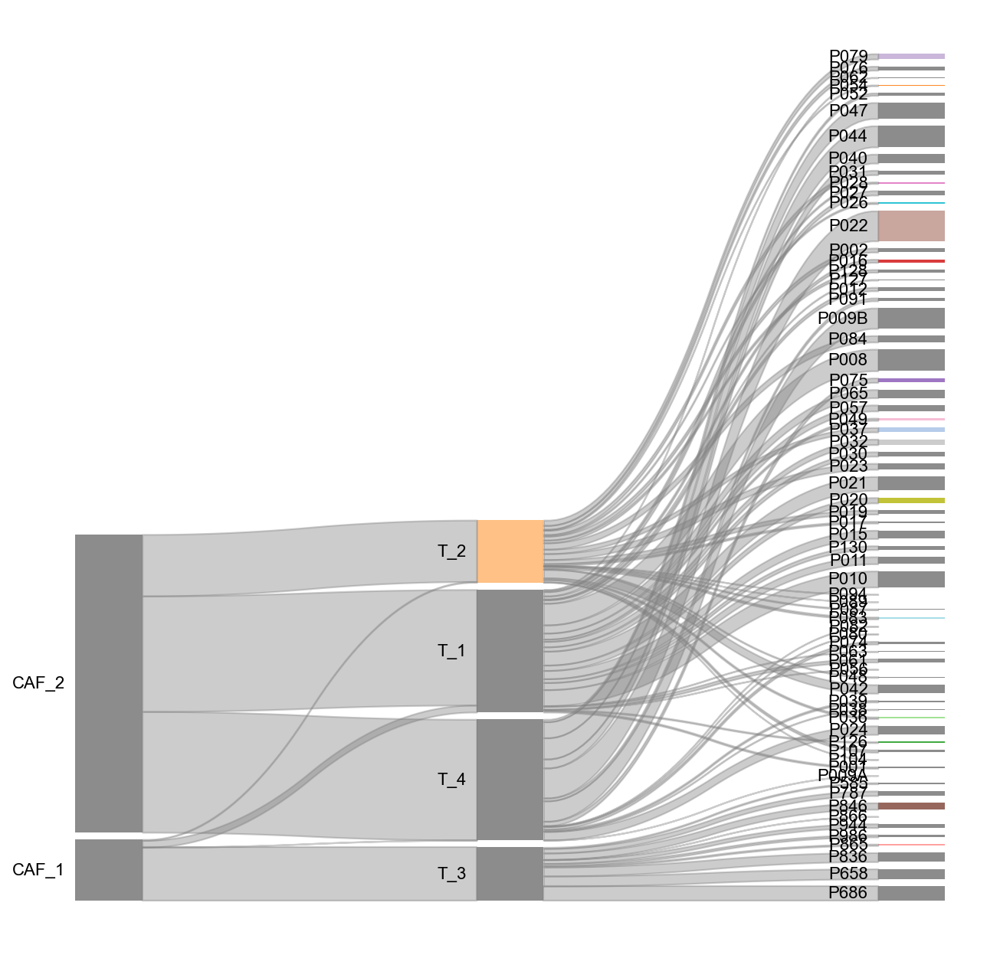

In [55]:
#pySnakey2 package
# for multilayer dataframe
import matplotlib.pyplot as plt
import pandas as pd
from pysankey2 import Sankey
from pysankey2.datasets import load_fruits
from pysankey2.utils import setColorConf


df_1 = df[['CAF_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("CAF_group_tumor_group_comparison.pdf", bbox_inches="tight", dpi=300)

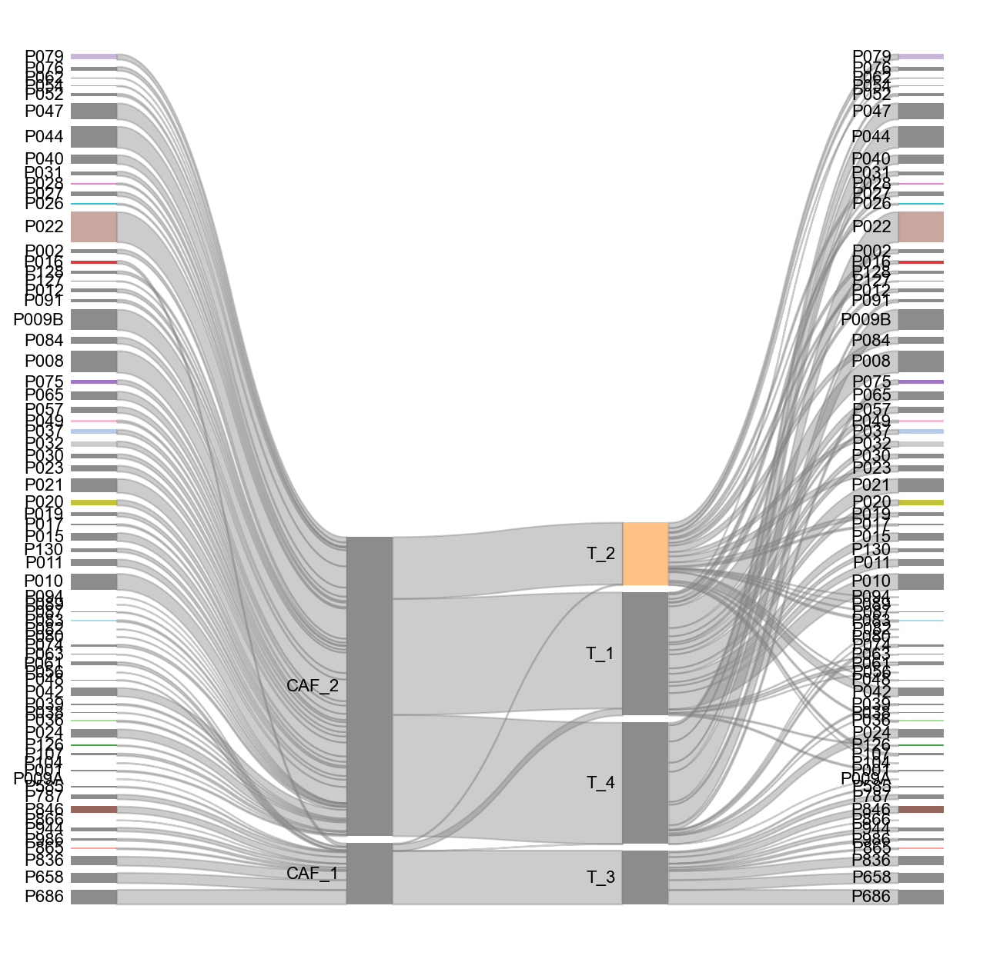

In [56]:
df_1 = df[['patient','CAF_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("CAF_group_tumor_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

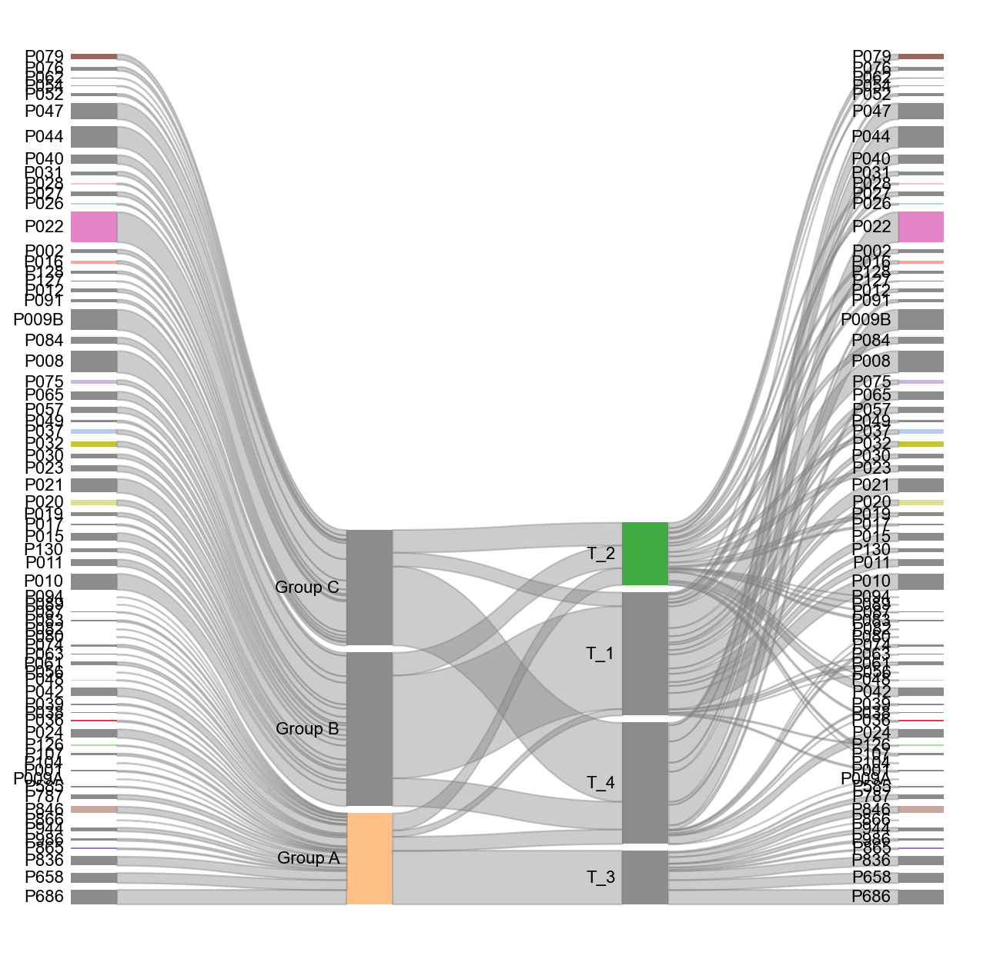

In [57]:
df_1 = df[['patient','patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_group_tumor_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

# Sankey plot with T cells (with Fibroblast classification)

In [58]:
adata_T = sc.read('T_cell_from_Group_ABC_patients_immune_after_harmony.h5ad')

In [59]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'T_1': ['P010','P008','P021','P049','P020','P062','P032','P016','P061','P012',
                     'P057','P015','P065','P063','P130','P056', 'P011','P127','P126','P001',
                     'P028','P027','P030'],
             'T_2': ['P037','P031','P026','P042','P019','P017','P036','P054','P023','P128',
                     'P048','P002','P104','P087','P094','P084','P079','P107','P076','P089',
                     'P083'],
                     
                   
             'T_3': [ 'P986','P658','P836','P866','P846','P686','P865','P585','P944','P787'],
             'T_4': ['P052','P024','P040','P039','P080','P075','P091','P009B','P082','P022',
                     'P074','P047','P038','P044','P009A']
              }

# Initialize empty column in cell metadata
adata_T.obs['T_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'T_patient_cluster4'] = i


In [60]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Myeloid_1': ['P063','P056','P009B','P075','P011','P032','P016','P104','P087','P089','P036','P083','P052',
                          'P047','P037','P091','P022','P074','P038','P082'],
            'Myeloid_2':  ['P130','P010','P986','P865','P585','P866','P846','P686','P658','P944','P836','P787'],
             'Myeloid_3': ['P040','P024','P017','P031','P026','P023','P049','P021','P107','P076','P079','P048','P062',
                          'P027','P065','P057','P008','P044','P001','P042','P094','P084','P080','P002','P061','P015'],
             'Myeloid_4': ['P128','P054','P019','P127','P126','P030','P028','P039','P020','P012'],
             'No_M': ['P009A']
              }

# Initialize empty column in cell metadata
adata_T.obs['Myeloid_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Myeloid_patient_cluster4'] = i


In [61]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'M1toT1': ["P011",	"P016",	"P032",	"P056",	"P063",],
             'M1toT2': ["P036",	"P037",	"P083",	"P087",	"P089",	"P104",],
             'M1toT3': [],
             'M1toT4': ["P009B",	"P022",	"P038",	"P047",	"P052",	"P074",	"P075",	"P082",	"P091",],
             'M2toT1': ["P010",	"P130",],
             'M2toT2': [],
             'M2toT3': ["P585",	"P658",	"P686",	"P787",	"P836",	"P846",	"P865",	"P866",	"P944",	"P986",],
             'M2toT4': [],
             'M3toT1': ["P001",	"P008",	"P015",	"P021",	"P027",	"P049",	"P057",	"P061",	"P062",	"P065",],
             'M3toT2': ["P002",	"P017",	"P023",	"P026",	"P031",	"P042",	"P048",	"P076",	"P079",	"P084",	"P094",	"P107",],
             'M3toT3': [],
             'M3toT4': ["P024",	"P040",	"P044",	"P080",],
             'M4toT1': ["P012",	"P020",	"P028",	"P030",	"P126",	"P127",],
             'M4toT2': ["P019",	"P054",	"P128",],
             'M4toT3': [],
             'M4toT4': ["P039",],
             'NoMtoT4': ["P009A",]
            }

# Initialize empty column in cell metadata
adata_T.obs['Myeloid_to_T_cluster44'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Myeloid_to_T_cluster44'] = i


In [62]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'CAF_1': ['P986','P658','P944','P865','P585','P846','P686','P866','P836','P787',
                     'P009A','P061','P016','P048','P063','P056'],
             'CAF_2': ['P082','P024','P094','P001','P127','P042','P039','P107','P020','P036',
                     'P027','P017','P011','P023','P047','P040','P104','P087','P126','P080',
                     'P009B','P075','P128','P057','P065','P002','P008','P089','P038','P084','P083','P049','P052','P031',
                       'P037','P032','P074',
                      'P044','P022','P079','P076','P021','P019','P012','P026','P028','P015','P054','P130','P010','P091',
                       'P062','P030']
              }

# Initialize empty column in cell metadata
adata_T.obs['CAF_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'CAF_patient_cluster'] = i


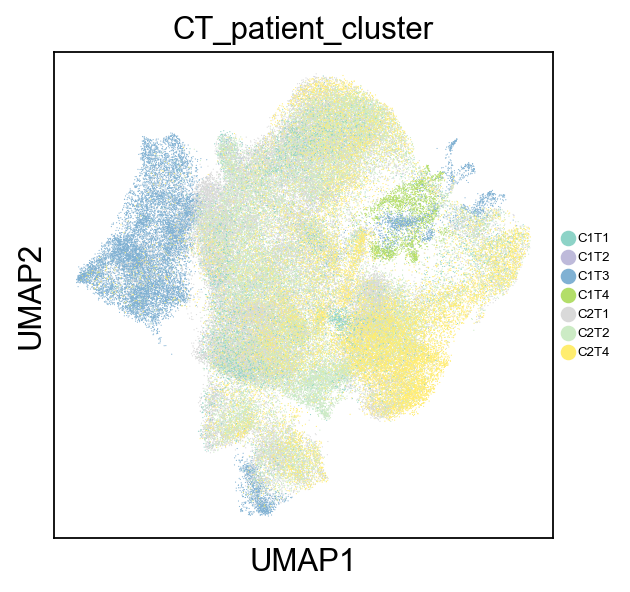

In [68]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'C1T1': ["P016",	"P056",	"P061",	"P063"],
             'C1T2':["P048"],
             'C1T3':["P585",'P658','P686','P787','P836','P846','P865','P866','P944','P986'],
             'C1T4':["P009A"],
            
             'C2T1': ['P001','P008','P010','P011','P012','P015','P020','P021','P027','P028','P030','P032','P049','P057',
                     'P062','P065','P126','P127','P130'],
            'C2T2': ["P002",	"P017",	"P019",	"P023",'P026','P031','P036','P037','P042','P054','P076','P079','P083',
                     'P084','P087','P089','P094','P104','P107','P128'],
             'C2T3':[],
             'C2T4':["P009B",	"P022",'P024','P038','P039','P040','P044','P047','P052','P074','P075','P080','P082','P091']}

# Initialize empty column in cell metadata
adata_T.obs['CT_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'CT_patient_cluster'] = i

sc.pl.umap(adata_T, color=['CT_patient_cluster'], legend_loc='right margin',palette ='Set3', legend_fontsize=6, save='umap_CT_patient_cluster_in_T_cell.pdf')


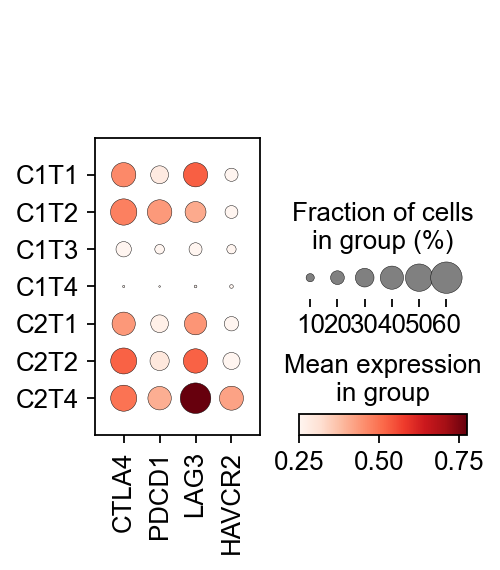

In [69]:
sc.pl.dotplot(adata_T, ['CTLA4','PDCD1','LAG3','HAVCR2'],vmin=0.25, groupby=['CT_patient_cluster'],save='exhausted_T_markers_in_T_cell_CT_group.pdf')

In [70]:
scv.set_figure_params(style='scvelo', dpi=100, dpi_save=300, frameon=None)

saving figure to file ./figures/scvelo__scatter_CT_Groups_in_Tcells.pdf


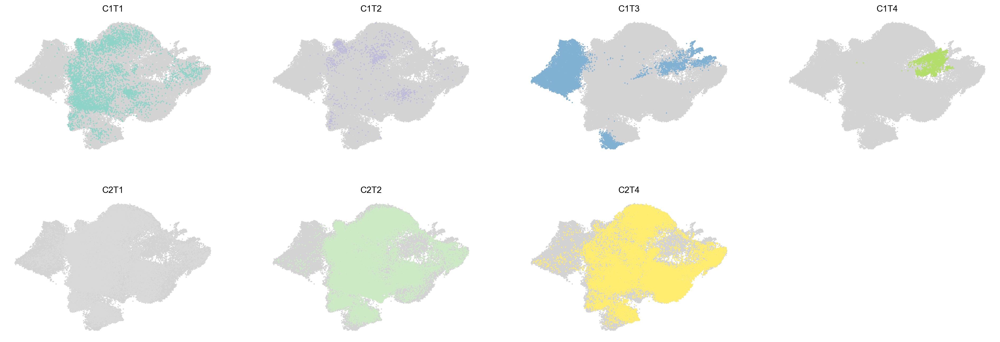

In [72]:
scv.pl.scatter(adata_T, groups=[[c] for c in adata_T.obs['CT_patient_cluster'].cat.categories], color='CT_patient_cluster', ncols=4, save="_scatter_CT_Groups_in_Tcells.pdf")

In [73]:
df = pd.DataFrame(adata_T.obs)
df

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,crude,celltype_detail,patient_cluster,dataset,T_patient_cluster,T_patient_cluster4,Myeloid_to_T_cluster44,Myeloid_patient_cluster4,CAF_patient_cluster,CT_patient_cluster
AAACCTGAGTAGCCGA-1-0-0,3934.0,3879,1452.073242,18.802568,1.294877,tumor,P686,6,0,198.197769,...,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,CAF_1,C1T3
AAACCTGCAAGAGGCT-1-0-0,674.0,669,882.995728,11.229170,1.271713,tumor,P686,6,0,213.666718,...,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,CAF_1,C1T3
AAACCTGCAGTATCTG-1-0-0,1014.0,1003,956.411804,18.788149,1.964441,tumor,P686,6,0,221.148575,...,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,CAF_1,C1T3
AAACCTGGTGCCTGGT-1-0-0,896.0,885,1091.559448,17.238060,1.579214,tumor,P686,6,0,176.360626,...,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,CAF_1,C1T3
AAACCTGGTGCGCTTG-1-0-0,786.0,772,876.556519,18.123993,2.067635,tumor,P686,6,0,217.813019,...,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,CAF_1,C1T3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGCAAATCA-1-24-2,1375.0,1351,1476.700806,22.369625,1.514838,tumor,P001,1,2,184.743835,...,T cell,effector T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,CAF_2,C2T1
TTTGGTTAGTGGTAAT-1-24-2,1606.0,1573,1480.355835,29.242380,1.975362,tumor,P001,4,2,188.684555,...,T cell,CD4 T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,CAF_2,C2T1
TTTGGTTCAAGCCATT-1-24-2,4456.0,4328,1867.209229,29.546848,1.582407,tumor,P001,0,2,172.502136,...,T cell,CD4 T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,CAF_2,C2T1
TTTGTCAGTCCTCTTG-1-24-2,2711.0,2644,1972.602417,24.433256,1.238631,tumor,P001,10,2,120.637726,...,T cell,exhausted T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,CAF_2,C2T1


In [74]:
print (df.dtypes)

n_genes                      float64
n_genes_by_counts              int32
total_counts                 float32
total_counts_mt              float32
pct_counts_mt                float32
tissue                      category
patient                     category
leiden                      category
batch                       category
total_counts_ribo            float32
pct_counts_ribo              float32
total_counts_hb              float32
pct_counts_hb                float32
percent_mt2                  float32
n_counts                     float32
celltype                    category
crude                       category
celltype_detail             category
patient_cluster             category
dataset                     category
T_patient_cluster            float64
T_patient_cluster4          category
Myeloid_to_T_cluster44      category
Myeloid_patient_cluster4    category
CAF_patient_cluster         category
CT_patient_cluster          category
dtype: object


In [75]:
df['patient'] = df['patient'].astype(object)
df['crude'] = df['crude'].astype(object)
df['leiden'] = df['leiden'].astype(object)
df['patient_cluster'] = df['patient_cluster'].astype(object)
df['Myeloid_patient_cluster4'] = df['Myeloid_patient_cluster4'].astype(object)
df['T_patient_cluster4'] = df['T_patient_cluster4'].astype(object)
df['CAF_patient_cluster'] = df['CAF_patient_cluster'].astype(object)
df['CT_patient_cluster'] = df['CT_patient_cluster'].astype(object)
df['Myeloid_to_T_cluster44'] = df['Myeloid_to_T_cluster44'].astype(object)
df['celltype'] = df['celltype'].astype(object)
df['batch'] = df['batch'].astype(object)


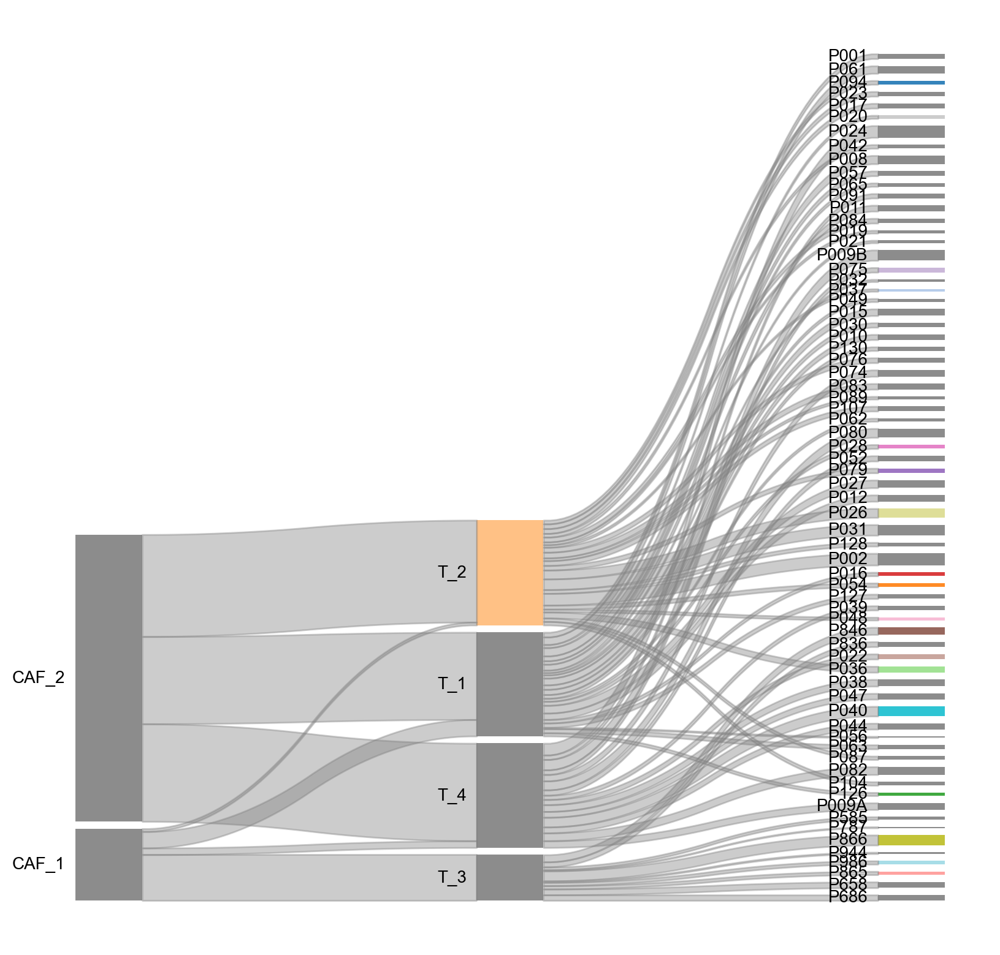

In [83]:
#pySnakey2 package
# for multilayer dataframe
import matplotlib.pyplot as plt
import pandas as pd
from pysankey2.datasets import load_fruits
from pysankey2.utils import setColorConf
from pysankey2 import Sankey

df_1 = df[['CAF_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_cell_CAF_group_Tcell_group_comparison.pdf", bbox_inches="tight", dpi=300)

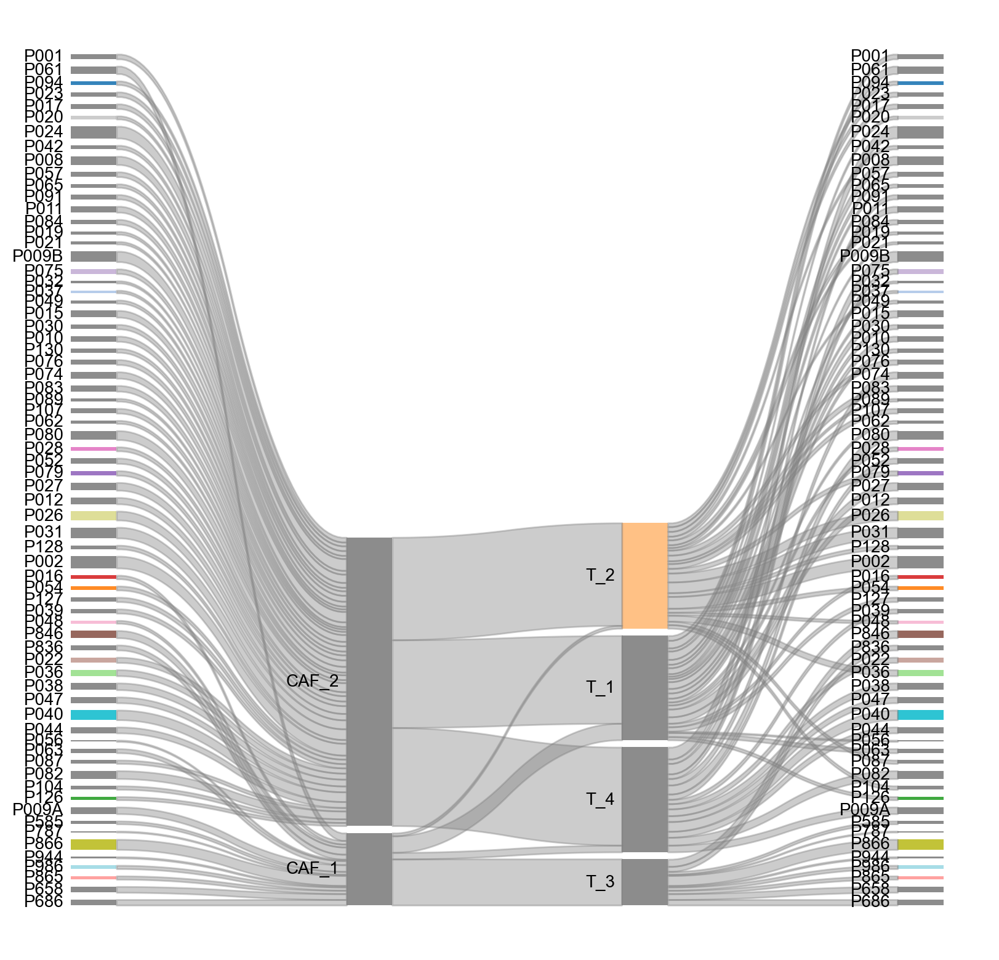

In [84]:
df_1 = df[['patient','CAF_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_cell_CAF_group_Tcell_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

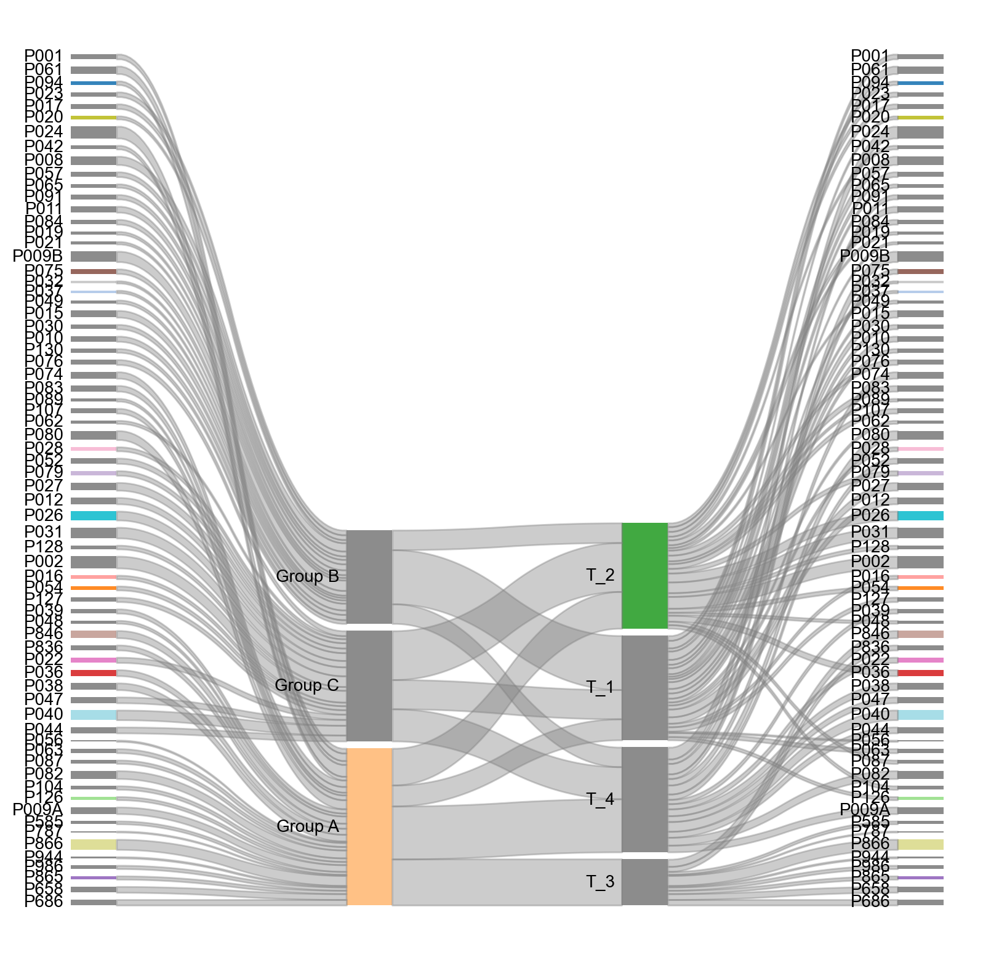

In [85]:
df_1 = df[['patient','patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_cell_tumor_group_Tcell_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

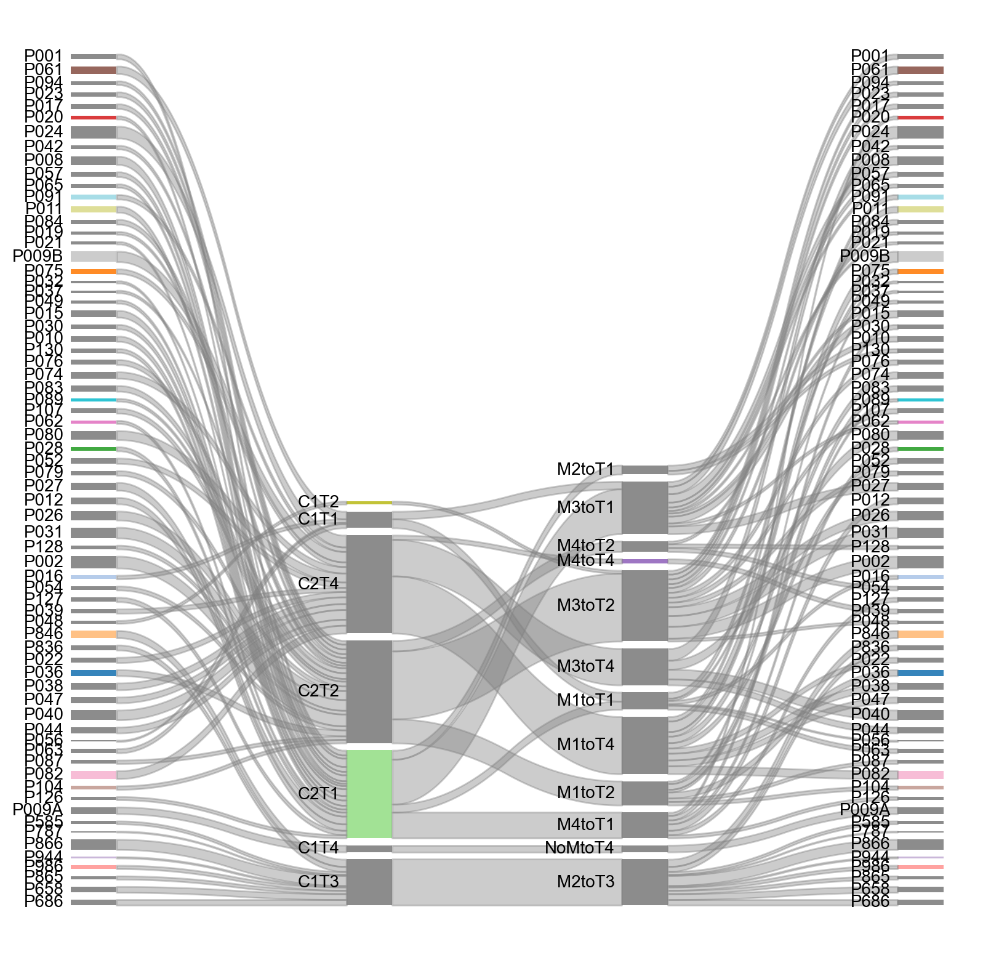

In [86]:
df_1 = df[['patient','CT_patient_cluster','Myeloid_to_T_cluster44','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("paitent_CT_group_Myeloid_T_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

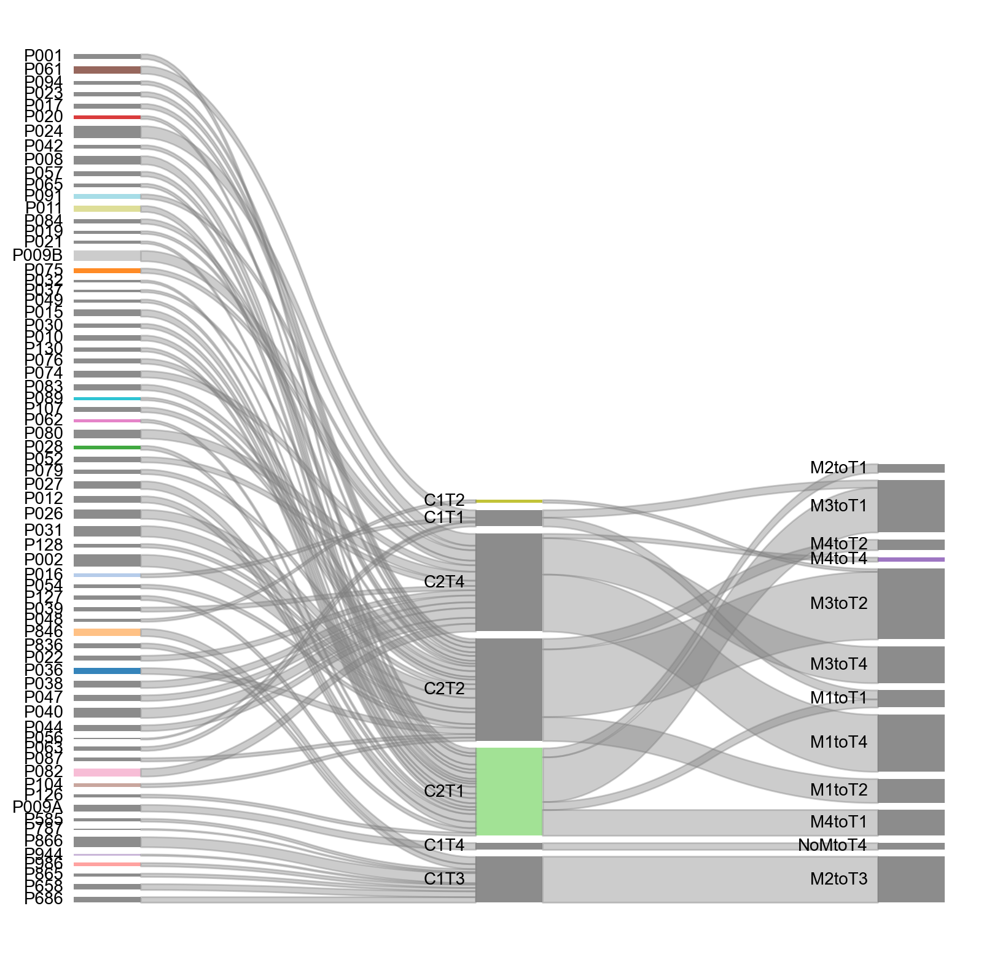

In [87]:
df_1 = df[['patient','CT_patient_cluster','Myeloid_to_T_cluster44']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("paitent_CT_group_Myeloid_T_group_comparison.pdf", bbox_inches="tight", dpi=300)

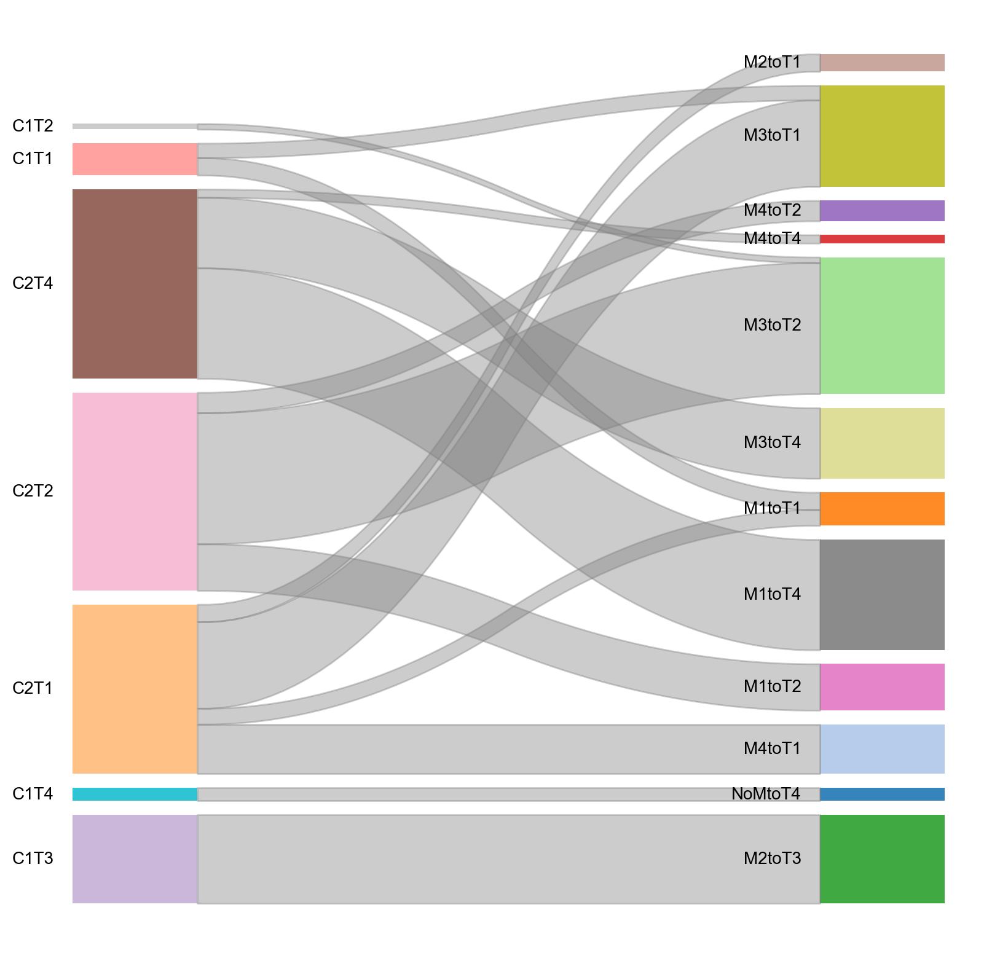

In [88]:
df_1 = df[['CT_patient_cluster','Myeloid_to_T_cluster44']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("CT_group_Myeloid_T_group_comparison_T_cells.pdf", bbox_inches="tight", dpi=300)

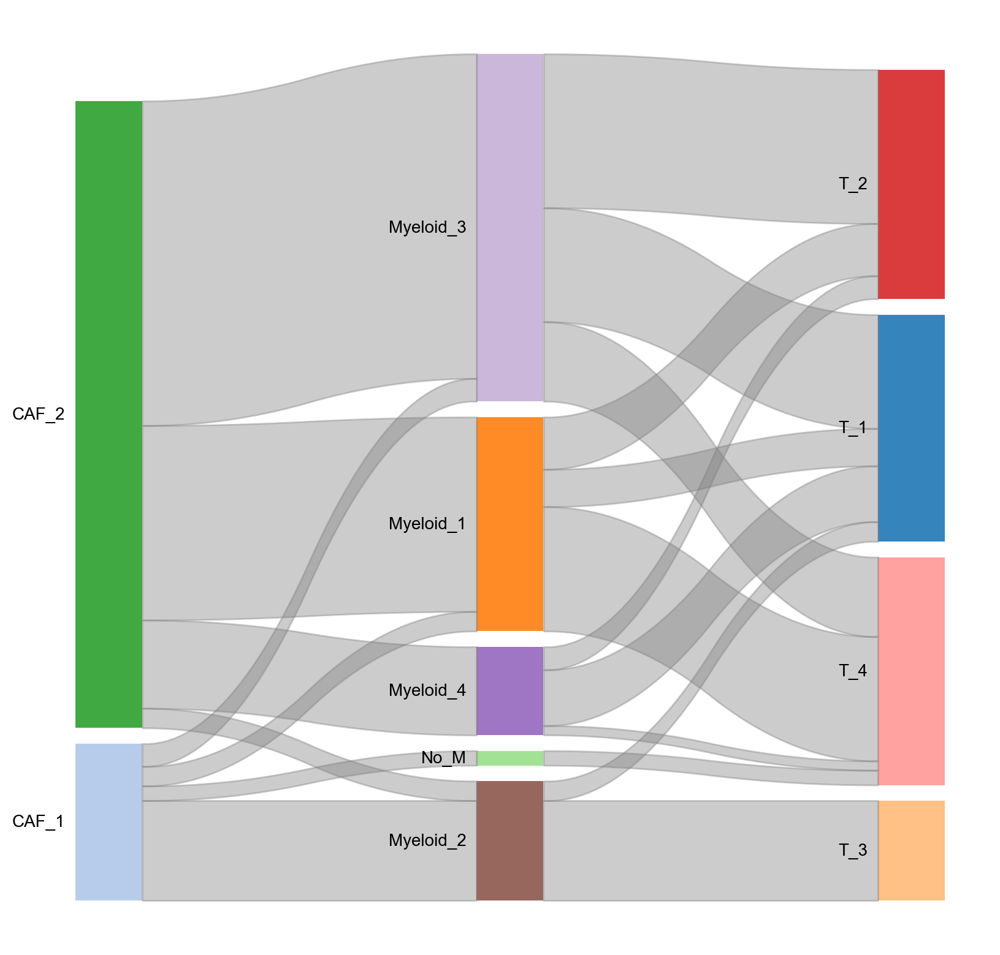

In [89]:
df_1 = df[['CAF_patient_cluster','Myeloid_patient_cluster4','T_patient_cluster4']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("CAF_Myeloid_T_group_in_T_cells.pdf", bbox_inches="tight", dpi=300)

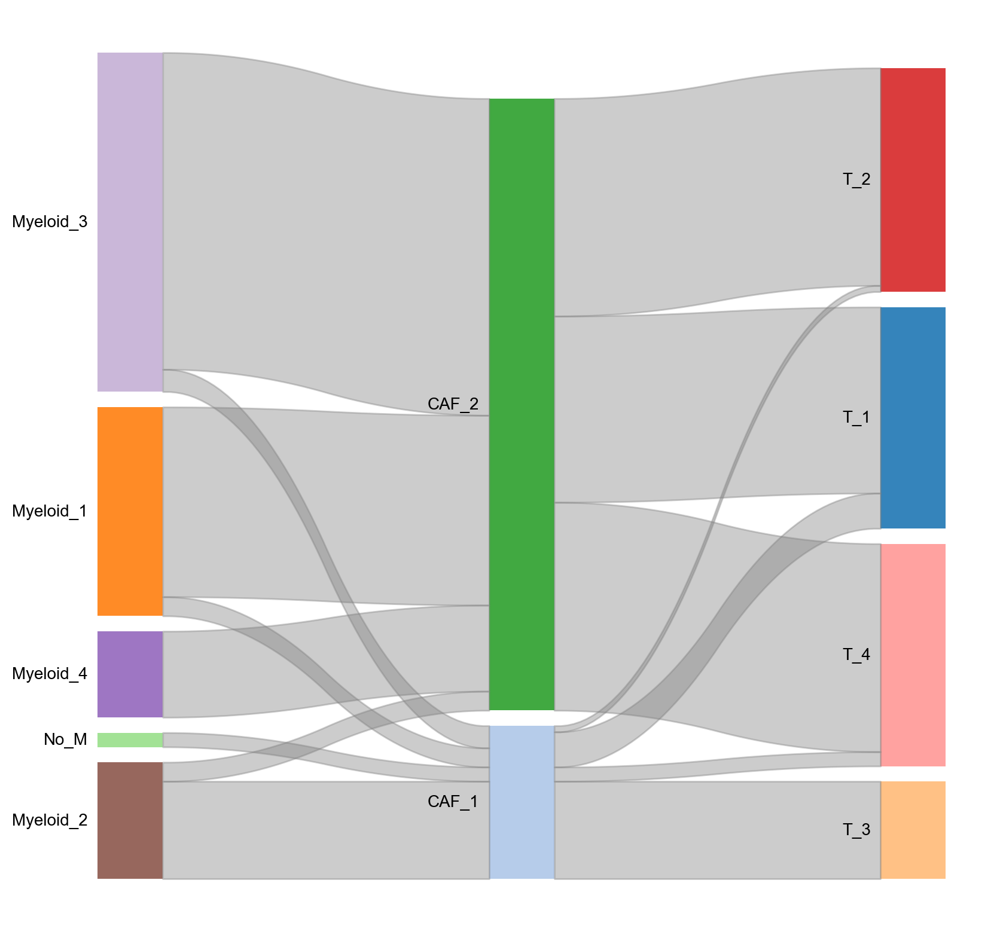

In [90]:
df_1 = df[['Myeloid_patient_cluster4','CAF_patient_cluster','T_patient_cluster4']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("CAF_Myeloid_T_group_in_T_cells_1.pdf", bbox_inches="tight", dpi=300)

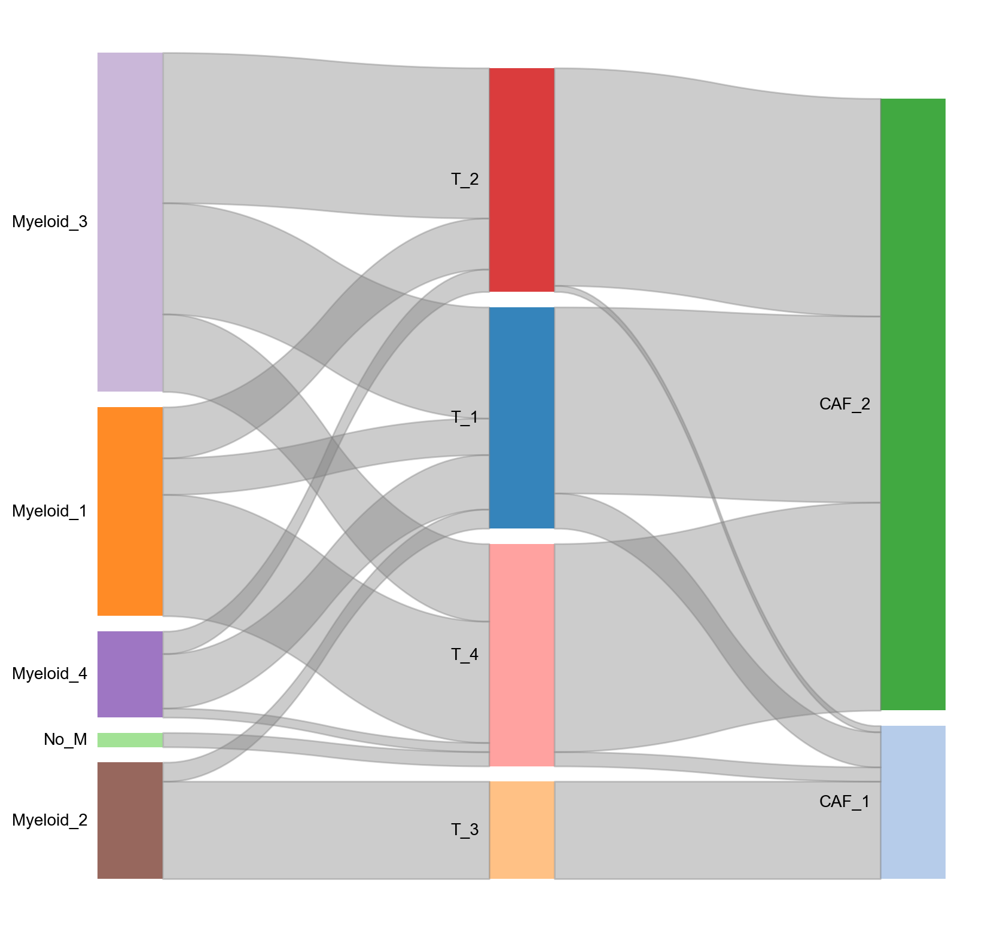

In [91]:
df_1 = df[['Myeloid_patient_cluster4','T_patient_cluster4','CAF_patient_cluster']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("CAF_Myeloid_T_group_in_T_cells_2.pdf", bbox_inches="tight", dpi=300)

# Integrated immune cells

In [ ]:
# all immune cells

adata_immn = sc.read('Group_ABC_after_celltype_clustering_Myel_Tcell_group_added.h5ad')

In [ ]:
adata_immn.obs

In [ ]:
adata_immn.obs['crude']

In [ ]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'M1toT1': ["P011",	"P016",	"P032",	"P056",	"P063",],
             'M1toT2': ["P036",	"P037",	"P083",	"P087",	"P089",	"P104",],
             'M1toT3': [],
             'M1toT4': ["P009B",	"P022",	"P038",	"P047",	"P052",	"P074",	"P075",	"P082",	"P091",],
             'M2toT1': ["P010",	"P130",],
             'M2toT2': [],
             'M2toT3': ["P585",	"P658",	"P686",	"P787",	"P836",	"P846",	"P865",	"P866",	"P944",	"P986",],
             'M2toT4': [],
             'M3toT1': ["P001",	"P008",	"P015",	"P021",	"P027",	"P049",	"P057",	"P061",	"P062",	"P065",],
             'M3toT2': ["P002",	"P017",	"P023",	"P026",	"P031",	"P042",	"P048",	"P076",	"P079",	"P084",	"P094",	"P107",],
             'M3toT3': [],
             'M3toT4': ["P024",	"P040",	"P044",	"P080",],
             'M4toT1': ["P012",	"P020",	"P028",	"P030",	"P126",	"P127",],
             'M4toT2': ["P019",	"P054",	"P128",],
             'M4toT3': [],
             'M4toT4': ["P039",],
             'NoMtoT4': ["P009A",]
            }

# Initialize empty column in cell metadata
adata_immn.obs['Myeloid_to_T_cluster44'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_immn.obs.patient).isin(cell_dict[i])
    adata_immn.obs.loc[ind,'Myeloid_to_T_cluster44'] = i


In [ ]:
adata_MT = adata_immn[adata_immn.obs['crude'].isin(['Myeloid cell','T cell'])]

In [ ]:
adata_MT

In [ ]:
sc.tl.rank_genes_groups(adata_MT, 'Myeloid_to_T_cluster44', method='wilcoxon', key_added = "MtoT_rank_genes")
sc.pl.rank_genes_groups(adata_MT, n_genes=25, sharey=False, key = "MtoT_rank_genes")

In [ ]:
df=pd.DataFrame(adata_MT.uns['MtoT_rank_genes']['names'])
df.to_csv("F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/Myeloid_to_T_cell_group_markergene_in_Myeloid_and_T_Cell.csv",
                 sep=',', na_rep='', float_format=None, columns=None, header=True, 
                 index=True, index_label=None, mode='w', encoding=None, compression='infer', 
                 quoting=None, quotechar='"', line_terminator=None, chunksize=None, date_format=None)

In [ ]:
#M1T4
sc.pl.dotplot(adata_MT, ["IFITM1",	"PPIB",	"SERPING1",	"TPM2",	"SERPINH1",	"LGALS1",	"CALD1",	"MYL9",	"COL1A1",	"FN1",	"UBE2L6",	"ID3",	"HSPA1A",	"LY6E",	"CTSK",	"SPARC",	"RTL8C",	"SELENOM",	"BEX3",	"TPM1",	"MDK",	"SERPINF1",	"CST3",	"RAB31",	"C1S",	"COL6A2",	"COL6A3",	"HSPB1",	"TIMP2",	"CAVIN3",	"CAPZB",
"AHSA1",	"CCL5",	"HCST",	"ACTB",	"APOBEC3G",	"PFN1",	"GZMA",	"MTRNR2L12",	"TMSB10",	"DYNLL1",	"HSP90AB1",	"IFI6",	"HLA-C",	"SOD1",	"NKG7",	"CTSC",	"CKLF",	"UBE2L6",	"CORO1A",	"PSME2",	"PRF1",	"LAG3",	"ID3",	"PHLDA1",	"IFITM1",	"DEDD2",	"PLAAT4",	"DUSP1",	"ATF3",	"ISG15",	"CAPZB",

                        ], groupby=['Myeloid_to_T_cluster44'])
#M3T4
sc.pl.dotplot(adata_MT, ["PCBP1",	"RAC1",	"PTMS",	"PFN1",	"ACTB",	"IFITM1",	"PCBP2",	"NME2",	"ISG15",	"ARF5",	"BST2",	"CFL1",	"GPX4",	"LY6E",	"ID3",	"TPI1",	"GNB2",	"YWHAZ",	"TPM4",	"MYL6",	"LMNA",	"CHCHD10",	"ACTN1",	"ATP5MC2",	"ATP5F1C",	"RHOA",	"PSMB9",	"GUK1",	"PGK1",	"P4HB",	"DSTN",
"SH2D2A",	"CXCR6",	"BTG1",	"PSMB9",	"OXNAD1",	"ISG15",	"CBLB",	"CD8A",	"CD96",	"ZFP36L2",	"LDLRAD4",	"DRAP1",	"ITGAE",	"BST2",	"IL2RB",	"LSP1",	"OAS1",	"PDE4D",	"HLA-DQA1",	"PLPP1",	"TSC22D3",	"CD3E",	"CD82",	"TENT5C",	"PHLDA1",	"APOBEC3G",	"CSF1",	"G3BP2",	"SP100",	"GNG2",	"DSTN",
                        ], groupby=['Myeloid_to_T_cluster44'])

sc.pl.dotplot(adata_MT, ["EIF2AK2",	"OASL",	"RGS1",	"ENTPD1",	"LAYN",	"SH3BGRL3",	"ALOX5AP",	"SHISA5",	"CORO1A",	"CD7",	"PTMS",	"DNPH1",	"NDFIP2",	"SOX4",	"KLRC2",	"IFI35",	"ANXA6",	"SLFN5",	"ATP8B4",	"PDLIM4",	"AC022126.1",	"XAF1",	"CD69",	"IFI44",	"NR4A2",	"GEM",	"RBPJ",	"CCND2",	"CD52",	"LRRN3",	"LINC01871",	"SIRPG",	"PARP8",	"MYO7A",	"CD3G",	"SOCS1",	"COMMD7",	"SYNGR2",	"UBE2L6",	"DLEU2",
], groupby=['Myeloid_to_T_cluster44'])

In [ ]:
#M1T4
sc.pl.dotplot(adata_MT, ['HSPB1','NKG7','CCL5','HSPA1A'],vmin=1, groupby=['Myeloid_to_T_cluster44'])

#M3T4
sc.pl.dotplot(adata_MT, ['IFI44','LINC01871'],vmin=0.2, groupby=['Myeloid_to_T_cluster44'])
              
#M1T4 & M3T4
#sc.pl.dotplot(adata_MT, ['UBE2L6','MDK','MYL6','PFN1','CFL1','ISG15'],vmin=0, groupby=['Myeloid_to_T_cluster44'], save='M1T4_and_M3T4_markers_in_epithelial_cells.pdf' )          

In [ ]:
# Added after analyzing Fibroblast 
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'F1T1': ['P036','P079','P083','P089','P107','P019','P032'],
             'F1T2':[],
             'F1T3':['P128','P015','P030','P130'],
             'F1T4':['P022','P028','P038','P082','P074','P024'],
            
             'F2T1': ['P054','P017','P021','P023','P084'],
            'F2T2': [],
             'F2T3':['P063','P012','P027','P028','P048','P062','P127','P049','P061'],
             'F2T4':['P040','P026','P039','P052','P042'],
 
             'F3T1': ['P016'],
             'F3T2':[],
             'F3T3':['P020','P126','P002',],
             'F3T4':['P080'],
             
             'F4T1':[],
             'F4T2':['P787','P944','P051','P866','P181','P686','P846','P658','P986','P585'],
             'F4T3':['P001'],
             'F4T4':['P037','P031'],
             
            'F5T1':['P087','P104','P076','P008','P010','P094'],
             'F5T2':[],
             'F5T3':['P056','P057','P065'],
             'F5T4':['P009A','P044','P047','P009B','P011','P075','P091']
             
              }

# Initialize empty column in cell metadata
adata_immn.obs['Fibro_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_immn.obs.patient).isin(cell_dict[i])
    adata_immn.obs.loc[ind,'Fibro_T_patient_cluster'] = i

sc.pl.umap(adata_immn, color=['Fibro_T_patient_cluster'], legend_loc='right margin', legend_fontsize=6)#, save='umap_Fibro_T_patient_cluster_in_Fibroblast.pdf')


# T cell dataset

In [78]:
adata_T = sc.read('T_cell_from_Group_ABC_patients_immune_after_harmony.h5ad')

In [79]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'T_1': ['P010','P008','P021','P049','P020','P062','P032','P016','P061','P012',
                     'P057','P015','P065','P063','P130','P056', 'P011','P127','P126','P001',
                     'P028','P027','P030'],
             'T_2': ['P037','P031','P026','P042','P019','P017','P036','P054','P023','P128',
                     'P048','P002','P104','P087','P094','P084','P079','P107','P076','P089',
                     'P083'],
                     
                   
             'T_3': [ 'P986','P658','P836','P866','P846','P686','P865','P585','P944','P787'],
             'T_4': ['P052','P024','P040','P039','P080','P075','P091','P009B','P082','P022',
                     'P074','P047','P038','P044','P009A']
              }

# Initialize empty column in cell metadata
adata_T.obs['T_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'T_patient_cluster4'] = i


In [80]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Myeloid_1': ['P063','P056','P009B','P075','P011','P032','P016','P104','P087','P089','P036','P083','P052',
                          'P047','P037','P091','P022','P074','P038','P082'],
            'Myeloid_2':  ['P130','P010','P986','P865','P585','P866','P846','P686','P658','P944','P836','P787'],
             'Myeloid_3': ['P040','P024','P017','P031','P026','P023','P049','P021','P107','P076','P079','P048','P062',
                          'P027','P065','P057','P008','P044','P001','P042','P094','P084','P080','P002','P061','P015'],
             'Myeloid_4': ['P128','P054','P019','P127','P126','P030','P028','P039','P020','P012']
              }

# Initialize empty column in cell metadata
adata_T.obs['Myeloid_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Myeloid_patient_cluster4'] = i


In [81]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'M1toT1': ["P011",	"P016",	"P032",	"P056",	"P063",],
             'M1toT2': ["P036",	"P037",	"P083",	"P087",	"P089",	"P104",],
             'M1toT3': [],
             'M1toT4': ["P009B",	"P022",	"P038",	"P047",	"P052",	"P074",	"P075",	"P082",	"P091",],
             'M2toT1': ["P010",	"P130",],
             'M2toT2': [],
             'M2toT3': ["P585",	"P658",	"P686",	"P787",	"P836",	"P846",	"P865",	"P866",	"P944",	"P986",],
             'M2toT4': [],
             'M3toT1': ["P001",	"P008",	"P015",	"P021",	"P027",	"P049",	"P057",	"P061",	"P062",	"P065",],
             'M3toT2': ["P002",	"P017",	"P023",	"P026",	"P031",	"P042",	"P048",	"P076",	"P079",	"P084",	"P094",	"P107",],
             'M3toT3': [],
             'M3toT4': ["P024",	"P040",	"P044",	"P080",],
             'M4toT1': ["P012",	"P020",	"P028",	"P030",	"P126",	"P127",],
             'M4toT2': ["P019",	"P054",	"P128",],
             'M4toT3': [],
             'M4toT4': ["P039",],
             'NoMtoT4': ["P009A",]
            }

# Initialize empty column in cell metadata
adata_T.obs['Myeloid_to_T_cluster44'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Myeloid_to_T_cluster44'] = i


In [82]:
sc.tl.rank_genes_groups(adata_T, 'Myeloid_to_T_cluster44', method='wilcoxon', key_added = "MtoT_rank_genes")
sc.pl.rank_genes_groups(adata_T, n_genes=25, sharey=False, key = "MtoT_rank_genes")

ranking genes


KeyboardInterrupt: 

In [ ]:
df=pd.DataFrame(adata_T.uns['MtoT_rank_genes']['names'])
df.to_csv("F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/Myeloid_to_T_cell_group_markergene_in_T_Cell.csv",
                 sep=',', na_rep='', float_format=None, columns=None, header=True, 
                 index=True, index_label=None, mode='w', encoding=None, compression='infer', 
                 quoting=None, quotechar='"', line_terminator=None, chunksize=None, date_format=None)

In [ ]:
#M1T4
sc.pl.dotplot(adata_T, ["IFITM1",	"PPIB",	"SERPING1",	"TPM2",	"SERPINH1",	"LGALS1",	"CALD1",	"MYL9",	"COL1A1",	"FN1",	"UBE2L6",	"ID3",	"HSPA1A",	"LY6E",	"CTSK",	"SPARC",	"RTL8C",	"SELENOM",	"BEX3",	"TPM1",	"MDK",	"SERPINF1",	"CST3",	"RAB31",	"C1S",	"COL6A2",	"COL6A3",	"HSPB1",	"TIMP2",	"CAVIN3",	"CAPZB",
], groupby=['Myeloid_to_T_cluster44'])
#M3T4
sc.pl.dotplot(adata_T, ["PCBP1",	"RAC1",	"PTMS",	"PFN1",	"ACTB",	"IFITM1",	"PCBP2",	"NME2",	"ISG15",	"ARF5",	"BST2",	"CFL1",	"GPX4",	"LY6E",	"ID3",	"TPI1",	"GNB2",	"YWHAZ",	"TPM4",	"MYL6",	"LMNA",	"CHCHD10",	"ACTN1",	"ATP5MC2",	"ATP5F1C",	"RHOA",	"PSMB9",	"GUK1",	"PGK1",	"P4HB",	"DSTN",
], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T, ["SH2D2A",	"CXCR6",	"BTG1",	"PSMB9",	"OXNAD1",	"ISG15",	"CBLB",	"CD8A",	"CD96",	"ZFP36L2",	"LDLRAD4",	"DRAP1",	"ITGAE",	"BST2",	"IL2RB",	"LSP1",	"OAS1",	"PDE4D",	"HLA-DQA1",	"PLPP1",	"TSC22D3",	"CD3E",	"CD82",	"TENT5C",	"PHLDA1",	"APOBEC3G",	"CSF1",	"G3BP2",	"SP100",	"GNG2",	"DSTN",
], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T, ["LSP1",	"LGALS9",	"CD82",	"IFI44",	"HLA-DPA1",	"RGS1",	"NR4A2",	"ACP5",	"GEM",	"ACTB",	"RGS2",	"GAPDH",	"LDLRAD4",	"TYMP",	"AKIRIN2",	"SH3BP1",	"COMMD7",	"RAC2",	"UBE2L6",	"IVNS1ABP",	"SHISA5",	"XAF1",	"TIGIT",	"SLFN5",	"DNPH1",	"IFITM3",	"SP100",	"MYO7A",	"CD8A",	"AC022126.1",	"ZYX",	"ICOS",	"GALNT2",	"LRRN3",	"DLEU2",	"LAYN",	"DYNLT1",	"IL32",	"CD9",	"OAS2",
], groupby=['Myeloid_to_T_cluster44'])

In [ ]:
#M1T4
sc.pl.dotplot(adata_T, ['HSPA1A'],vmin=2, groupby=['Myeloid_to_T_cluster44'], save='M1T4_marker_in_T_cell(1).pdf')
sc.pl.dotplot(adata_T, ['HSPB1','LY6E'],vmin=1, groupby=['Myeloid_to_T_cluster44'], save='M1T4_marker_in_T_cell(2).pdf')
sc.pl.dotplot(adata_T, ['ID3','SERPINH1'],vmin=0.1, groupby=['Myeloid_to_T_cluster44'], save='M1T4_marker_in_T_cell(3).pdf')
sc.pl.dotplot(adata_T, ['HSPB1','LY6E','SERPINH1'],vmin=0.5, vmax=1.5,groupby=['Myeloid_to_T_cluster44'], save='M1T4_marker_in_T_cell(4).pdf')

#M3T4
sc.pl.dotplot(adata_T, ['BST2','HLA-DQA1','PLPP1','CSF1'],vmin=0.2, groupby=['Myeloid_to_T_cluster44'], save='M3T4_marker_in_T_cell(1).pdf')
              
#M1T4 & M3T4
#sc.pl.dotplot(adata_MT, [],vmin=0, groupby=['Myeloid_to_T_cluster44'], save='M1T4_and_M3T4_markers_in_epithelial_cells.pdf' )          

In [ ]:
sc.pl.dotplot(adata_T, ['HSPA1A','HSPB1','LY6E','ID3','SERPINH1'], groupby=['Myeloid_to_T_cluster44'], save='M1T4_marker_in_T_cell(5).pdf')
sc.pl.dotplot(adata_T, ['HSPA1A','HSPB1','LY6E','ID3','SERPINH1','HLA-DQA1','BST2'], groupby=['Myeloid_to_T_cluster44'], save='M1T4_M3T4_marker_in_T_cell.pdf')


In [ ]:
#M2T2
sc.pl.dotplot(adata_T, ["RPS29",	"RPS20",	"RPL27A",	"RPS27",	"RPS11",	"RPL23",	"RPL34",	"RPL7",	"RPL37A",	"DYNLRB1",	"RPL38",	"SNRPD3",	"EIF1",	"RPL39",	"RPL35",	"RPS16",	"TPT1",	"RPS14",	"RPL23A",	"B2M",	"RPL31",	"RPS28",	"RPLP1",	"RPS15",	"RGS1",	"FTL",	"CD79A",	"MZB1",	"RPL26",	"SRGN",	"RPS19",
], groupby=['Myeloid_to_T_cluster44'])#, save='M1T4_marker_in_T_cell(5).pdf')
sc.pl.dotplot(adata_T, ["RPL36A",	"GAS5",	"RPS6",	"RPL23A",	"SNHG32",	"EVI2A",	"RPL35",	"RPL37A",	"CXCL1",	"ATP1B3",	"RPS18",	"CXCL3",	"RPL34",	"UQCRB",	"C1orf56",	"AC092338.3",	"IGLC1",	"FTH1",	"UBA52",	"TXN",	"AC058791.1",	"IGHG1",	"CXCL2",	"HMGB2",	"CXCR4",	"RPL9",	"FTL",	"S100A2",	"SOD2",	"CD63",	"RPS19",
], groupby=['Myeloid_to_T_cluster44'])#, save='M1T4_M3T4_marker_in_T_cell.pdf')
sc.pl.dotplot(adata_T, ["S100A2",	"RPL4",	"IGLC3",	"IFI16",	"SRSF5",	"NAA10",	"S100A9",	"CXCL3",	"TMSB4X",	"YBX1",	"CMSS1",	"CXCL2",	"FTH1",	"S100A8",	"ATP5ME",	"TRGC2",	"PCSK7",	"PSMA4",	"POLR2J",	"AL121933.2",	"POLR2J3",	"RPL10A",	"SEPTIN7",	"RPL10",	"AC245297.3",	"FKBP5",	"GABPB1-IT1",	"AC009107.2",	"GCC2",	"JCHAIN",	"NOP53",	"IL6",	"DDT",	"RPL39",	"IGHA2",	"EIF5B",	"IL7R",	"AC133644.2"
], groupby=['Myeloid_to_T_cluster44'])#, save='M1T4_M3T4_marker_in_T_cell.pdf')
sc.pl.dotplot(adata_T, ["ZFAS1",	"EIF3J",	"CD59",	"CCZ1",	"ATF4",	"FTL",	"HIGD1A",	"RPL13",	"GPR82",	"FCER1G",	"HNRNPA1P48",	"TIMP1",	"CST3",	"JAML",	"GGPS1",	"BOLA2",	"RPS3A",	"PLAC8",	"UPK3BL1",	"AC064836.4",	"GCHFR",	"FAM215B",	"NOP56",	"N4BP2L2",	"CBX6",	"DPM1",	"GSTO1",	"SRGN",	"CBWD1",	"DCTN6"
], groupby=['Myeloid_to_T_cluster44'])#, save='M1T4_M3T4_marker_in_T_cell.pdf')




In [ ]:
#M2T2
#nothing related to prognosis
sc.pl.dotplot(adata_T, ['SNHG32','EVI2A','IGHG1','C1orf56','IGLC1',#'AC058791.1','AC092338.3','CXCL1','CXCL2','CXCL3','S100A2'
                       ], groupby=['Myeloid_to_T_cluster44'], save='M2T2_marker_in_T_cell.pdf')
sc.pl.dotplot(adata_T, ['SNRPD3','GAS5','SNHG32','EVI2A','CXCL1','CXCL3','C1orf56','IGLC1','IGHG1','CXCL2','HMGB2',
                       'S100A2'], groupby=['Myeloid_to_T_cluster44'])#, save='M2T2_marker_in_T_cell.pdf')

In [ ]:
#M1T4, M3T4, M2T2
sc.pl.dotplot(adata_T, ['HSPA1A','LY6E','HSPB1','BST2','ID3','SERPINH1','HLA-DQA1',
                        
                       'EVI2A','SNHG32','SNRPD3','IGLC1','IGHG1'
                       ], groupby=['Myeloid_to_T_cluster44'])#, save='M1T4_M3T4_M2T2_marker_in_T_cell.pdf')
sc.pl.dotplot(adata_T, ['HSPB1','BST2','ID3','HLA-DQA1',
                        
                       'EVI2A','SNHG32','SNRPD3','IGLC1','IGHG1'
                       ], groupby=['Myeloid_to_T_cluster44'], save='M1T4_M3T4_M2T2_marker_in_T_cell.pdf')


# Myeloid cell dataset

In [ ]:
adata_M = sc.read('Myeloid_cell_from_Group_ABC_patients_immune_after_harmony.h5ad')

In [ ]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'T_1': ['P010','P008','P021','P049','P020','P062','P032','P016','P061','P012',
                     'P057','P015','P065','P063','P130','P056', 'P011','P127','P126','P001',
                     'P028','P027','P030'],
             'T_2': ['P037','P031','P026','P042','P019','P017','P036','P054','P023','P128',
                     'P048','P002','P104','P087','P094','P084','P079','P107','P076','P089',
                     'P083'],
                     
                   
             'T_3': [ 'P986','P658','P836','P866','P846','P686','P865','P585','P944','P787'],
             'T_4': ['P052','P024','P040','P039','P080','P075','P091','P009B','P082','P022',
                     'P074','P047','P038','P044','P009A']
              }

# Initialize empty column in cell metadata
adata_M.obs['T_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_M.obs.patient).isin(cell_dict[i])
    adata_M.obs.loc[ind,'T_patient_cluster4'] = i


In [ ]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Myeloid_1': ['P063','P056','P009B','P075','P011','P032','P016','P104','P087','P089','P036','P083','P052',
                          'P047','P037','P091','P022','P074','P038','P082'],
            'Myeloid_2':  ['P130','P010','P986','P865','P585','P866','P846','P686','P658','P944','P836','P787'],
             'Myeloid_3': ['P040','P024','P017','P031','P026','P023','P049','P021','P107','P076','P079','P048','P062',
                          'P027','P065','P057','P008','P044','P001','P042','P094','P084','P080','P002','P061','P015'],
             'Myeloid_4': ['P128','P054','P019','P127','P126','P030','P028','P039','P020','P012']
              }

# Initialize empty column in cell metadata
adata_M.obs['Myeloid_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_M.obs.patient).isin(cell_dict[i])
    adata_M.obs.loc[ind,'Myeloid_patient_cluster4'] = i


In [ ]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'M1toT1': ["P011",	"P016",	"P032",	"P056",	"P063",],
             'M1toT2': ["P036",	"P037",	"P083",	"P087",	"P089",	"P104",],
             'M1toT3': [],
             'M1toT4': ["P009B",	"P022",	"P038",	"P047",	"P052",	"P074",	"P075",	"P082",	"P091",],
             'M2toT1': ["P010",	"P130",],
             'M2toT2': [],
             'M2toT3': ["P585",	"P658",	"P686",	"P787",	"P836",	"P846",	"P865",	"P866",	"P944",	"P986",],
             'M2toT4': [],
             'M3toT1': ["P001",	"P008",	"P015",	"P021",	"P027",	"P049",	"P057",	"P061",	"P062",	"P065",],
             'M3toT2': ["P002",	"P017",	"P023",	"P026",	"P031",	"P042",	"P048",	"P076",	"P079",	"P084",	"P094",	"P107",],
             'M3toT3': [],
             'M3toT4': ["P024",	"P040",	"P044",	"P080",],
             'M4toT1': ["P012",	"P020",	"P028",	"P030",	"P126",	"P127",],
             'M4toT2': ["P019",	"P054",	"P128",],
             'M4toT3': [],
             'M4toT4': ["P039",],
             'NoMtoT4': ["P009A",]
            }

# Initialize empty column in cell metadata
adata_M.obs['Myeloid_to_T_cluster44'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_M.obs.patient).isin(cell_dict[i])
    adata_M.obs.loc[ind,'Myeloid_to_T_cluster44'] = i


In [ ]:
sc.tl.rank_genes_groups(adata_M, 'Myeloid_to_T_cluster44', method='wilcoxon', key_added = "MtoT_rank_genes")
sc.pl.rank_genes_groups(adata_M, n_genes=25, sharey=False, key = "MtoT_rank_genes")

In [ ]:
df=pd.DataFrame(adata_M.uns['MtoT_rank_genes']['names'])
df.to_csv("F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/Myeloid_to_T_cell_group_markergene_in_Myeloid_Cell.csv",
                 sep=',', na_rep='', float_format=None, columns=None, header=True, 
                 index=True, index_label=None, mode='w', encoding=None, compression='infer', 
                 quoting=None, quotechar='"', line_terminator=None, chunksize=None, date_format=None)

In [ ]:
#M1T4
sc.pl.dotplot(adata_M, ["IFITM3",	"TYROBP",	"VAMP5",	"TMSB10",	"AIF1",	"VAMP8",	"FCGR3A",	"UBE2L6",	"PSME2",	"DNAJB1",	"LY6E",	"HSPA1B",	"HSPA6",	"PYCARD",	"RASGEF1B",	"CD14",	"HLA-C",	"MS4A6A",	"CD68",	"RHOB",	"BST2",	"PLAAT4",	"IFI30",	"HSPA1A",	"IFI6",	"S100A11",	"SERPING1",	"HSPB1",	"STAT1",	"CST3",	"HSPA8",
], groupby=['Myeloid_to_T_cluster44'])


In [ ]:
#M1T4
sc.pl.dotplot(adata_M, [ 'HSPB1','VAMP8','MS4A6A','FCGR3A','HSPA6','VAMP5'
                       ], groupby=['Myeloid_to_T_cluster44'])
#M3T4
#sc.pl.dotplot(adata_MT, [],vmin=0.2, groupby=['Myeloid_to_T_cluster44'])
              
#M1T4 & M3T4
#sc.pl.dotplot(adata_MT, [],vmin=0, groupby=['Myeloid_to_T_cluster44'], save='M1T4_and_M3T4_markers_in_epithelial_cells.pdf' )          

In [ ]:
#M3T4
sc.pl.dotplot(adata_M, ["MALT1",	"SEMA7A",	"NR4A3",	"TWISTNB",	"ETV6",	"LDLRAD4",	"SPIB",	"IRF4",	"ADAM19",	"NR4A1",	"TSPAN13",	"CALCRL",	"PPP1R16B",	"HIVEP1",	"MX1",	"PIM2",	"PDE7A",	"PPP1R14A",	"GPR157",	"GZMB",	"PCBP1",	"AUTS2",	"LTB",	"C12orf75",	"CCR7",	"RFTN1",	"TSEN54",	"BCL3",	"RAB11FIP1",
], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_M, ["SLC25A6",	"RPS7",	"RPS8",	"CD83",	"RPL29",	"RPL18",	"EEF2",	"PIM3",	"ITGB2",	"RACK1",	"ELMO1",	"RPSA",	"RPS3",	"PPA1",	"GRN",	"EEF1A1",	"LGALS2",	"JAML",	"RPS26",	"LYN",	"GSN",	"CNN2",	"VOPP1",	"HLA-C",	"EIF3L",	"IRF8",	"MAN2B1",	"RPL5",	"PAXX",	"NFKBID",	"CORO1A",
], groupby=['Myeloid_to_T_cluster44'])
#sc.pl.dotplot(adata_M, ["LSP1",	"LGALS9",	"CD82",	"IFI44",	"HLA-DPA1",	"RGS1",	"NR4A2",	"ACP5",	"GEM",	"ACTB",	"RGS2",	"GAPDH",	"LDLRAD4",	"TYMP",	"AKIRIN2",	"SH3BP1",	"COMMD7",	"RAC2",	"UBE2L6",	"IVNS1ABP",	"SHISA5",	"XAF1",	"TIGIT",	"SLFN5",	"DNPH1",	"IFITM3",	"SP100",	"MYO7A",	"CD8A",	"AC022126.1",	"ZYX",	"ICOS",	"GALNT2",	"LRRN3",	"DLEU2",	"LAYN",	"DYNLT1",	"IL32",	"CD9",	"OAS2",
#], groupby=['Myeloid_to_T_cluster44'])

In [ ]:
#M2T2
sc.pl.dotplot(adata_M, ["RPS20",	"RPS10",	"RPL27A",	"RPL13A",	"RPS17",	"RPS29",	"RPL7",	"RPL23",	"RPL21",	"RPS11",	"IGKC",	"SNHG5",	"RPL38",	"RPS27",	"TXN",	"IGHG4",	"IGHA1",	"DYNLRB1",	"RPL31",	"THBS1",	"CD63",	"RPLP2",	"IGLC2",	"RPS16",	"CXCL8",	"LAPTM4A",	"SLC7A11",	"NAP1L1",	"HLA-DRA",	"IGHG3",	"TXNRD1"
], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_M, ["EEF1G",	"VMO1",	"RPL37A",	"B2M",	"CXCR4",	"C1orf56",	"SNRPD3",	"UQCRB",	"RPL27",	"SAT1",	"RIT1",	"CD59",	"HLA-DRB1",	"CYP1B1",	"GPAT3",	"CXCL1",	"EMP3",	"TFPI",	"RPL17",	"SDC2",	"GAS5",	"GCLM",	"CXCL3",	"IGLC1",	"MGST1",	"SNHG32",	"SEC62",	"SDCBP",	"ANXA1",	"EVI2A",	"TXNRD1"
], groupby=['Myeloid_to_T_cluster44'])
#sc.pl.dotplot(adata_M, ["SLC25A6",	"RPS7",	"RPS8",	"CD83",	"RPL29",	"RPL18",	"EEF2",	"PIM3",	"ITGB2",	"RACK1",	"ELMO1",	"RPSA",	"RPS3",	"PPA1",	"GRN",	"EEF1A1",	"LGALS2",	"JAML",	"RPS26",	"LYN",	"GSN",	"CNN2",	"VOPP1",	"HLA-C",	"EIF3L",	"IRF8",	"MAN2B1",	"RPL5",	"PAXX",	"NFKBID",	"CORO1A",
#], groupby=['Myeloid_to_T_cluster44'])


In [ ]:
#M2T2
#SNRPD3 good prognosis
sc.pl.dotplot(adata_M, ['TXN','SNHG5',"IGKC",'IGHG4','IGLC2','SNRPD3'
                       ], groupby=['Myeloid_to_T_cluster44'], save='M2T2_markers_in_myeloid_cell.pdf')


In [ ]:
#M1T4
sc.pl.dotplot(adata_M, [ 'VAMP8','MS4A6A','FCGR3A','HSPA6','VAMP5',
                        'SNHG5',"IGKC",'IGHG4','IGLC2','SNRPD3'
                       ], groupby=['Myeloid_to_T_cluster44'], save='M1T4_M2T2_markers_in_Myeloid_cell.pdf')

In [ ]:
sc.pl.dotplot(adata_T, ['PDCD1','TIGIT','CD226'], groupby=['Myeloid_to_T_cluster44'], save='dotplot_PDCD1,TIGIT,CD226_in_T_cell.pdf')

In [ ]:
sc.pl.dotplot(adata_M, ['NECTIN2','TIGIT'], groupby=['Myeloid_to_T_cluster44'],save='dotplot_NECTIN,TIGIT_in_M_cell.pdf')
sc.pl.dotplot(adata_M, ['NECTIN2','TIGIT'], groupby=['Myeloid_patient_cluster4'])

# Integrated data

In [ ]:
adata = adata_epi.concatenate(adata_immn)

In [ ]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
sc.tl.umap(adata)

In [ ]:
adata_epi.obs

In [ ]:
adata_immn.obs

In [ ]:
adata.obs

In [ ]:
# Patient groups from tumor cell analysis of 03-07-23
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = { 'Group A': ["P061",	"P094",	"P001",	"P080",	"P024",	"P036",	"P042",	"P082",	"P104",	"P056",	"P063",	"P009A",	"P866",	"P787",	"P986",	"P836",	"P658",	"P686",	"P944",	"P087",	"P039",	"P048",	"P038",	"P126",	"P585",	"P865",	"P846",	"P089",	"P107",	"P083",	"P074"
],
             'Group B': ["P010",	"P130",	"P015",	"P030",	"P049",	"P032",	"P037",	"P017",	"P020",	"P023",	"P019",	"P021",	"P011",	"P084",	"P091",	"P009B",	"P075",	"P057",	"P065",	"P008",	"P008"
],
             'Group C': ["P028",	"P052",	"P012",	"P027",	"P026",	"P128",	"P031",	"P054",	"P062",	"P127",	"P079",	"P076",	"P002",	"P016",	"P040",	"P047",	"P022",	"P044"
]}

# Initialize empty column in cell metadata
adata.obs['patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs.patient).isin(cell_dict[i])
    adata.obs.loc[ind,'patient_cluster'] = i

#sc.pl.pca(adata, color=['patient_cluster_modified'], legend_loc='right margin', legend_fontsize=6)

In [ ]:
adata.write('epi_immn_concatenated.h5ad')

In [ ]:
adata = sc.read('epi_immn_concatenated.h5ad')

In [ ]:
df1 = pd.crosstab(adata.obs['patient'],adata.obs['T_patient_cluster4'])
df1

In [ ]:
df2 = pd.crosstab(adata.obs['patient'],adata.obs['Myeloid_patient_cluster4'])
df2

In [ ]:
df3 = pd.crosstab(adata.obs['patient'],adata.obs['Myeloid_to_T_cluster44'])
df3

In [ ]:
df4= pd.crosstab(adata.obs['patient'],adata.obs['patient_cluster'])

In [ ]:
df5 = pd.concat([df1, df2, df3,df4], axis=1, ignore_index=False)
df5

In [ ]:
df5.to_csv('patient_T_M_MT_tumor_class.csv')

In [ ]:
adata_EM = adata[adata.obs['crude'].isin(['epithelial','Myeloid cell'])]

In [ ]:
adata_M = adata[adata.obs['crude'].isin(['Myeloid cell'])]

In [ ]:
adata_T = adata[adata.obs['crude'].isin(['T cell'])]

In [ ]:
## louvain tool again required

In [ ]:
sc.pl.dotplot(adata, ['NECTIN2'], groupby=['patient_cluster'])
sc.pl.dotplot(adata, ['NECTIN2'], groupby=['T_patient_cluster4'])
sc.pl.dotplot(adata, ['NECTIN2'], groupby=['Myeloid_patient_cluster4'])
sc.pl.dotplot(adata, ['NECTIN2'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata, ['NECTIN2'], groupby=['crude'])

In [ ]:
sc.pl.umap(adata, color=['crude'])#, save='epi_and_immn_cells.pdf')

In [ ]:
sc.pl.umap(adata, color=['crude'],
           palette="Accent")#, save='epi_and_immn_cells.pdf')

In [ ]:
sc.pl.umap(adata, color=['crude'],
           palette="Set2")#, save='epi_and_immn_cells.pdf')

In [ ]:
sc.pl.umap(adata, color=['crude'],
           palette="Set1")#, save='epi_and_immn_cells.pdf')

In [ ]:
sc.pl.umap(adata, color=['crude'],
           palette="Set3")#, save='epi_and_immn_cells.pdf')

In [ ]:
sc.pl.umap(adata, color=['crude'],
           palette="tab20")#, save='epi_and_immn_cells.pdf')

In [ ]:
sc.pl.umap(adata_immn, color=['crude'],
           cmap='Accent')#, save='_immn_cells_by_crude.pdf')

In [ ]:
sc.pl.umap(adata, color=['crude'],cmap='tab20')

In [ ]:
sc.pl.umap(adata, color=['crude'],
          palette={
        "B cell": "red",
        "Mast cell": "cornflowerblue",
        "Mixed": "purple",
        "Myeloid cell": "darkorange",
              "Plasma cell":"saddlebrown",
              "T cell":"hotpink",
              "epithelial":"gray"
    } , save='epi_and_immn_cells.pdf')

In [ ]:
sc.pl.umap(adata_immn, color=['crude'], 
           palette={"B cell": "red",
        "Mast cell": "cornflowerblue",
        "Mixed": "purple",
        "Myeloid cell": "darkorange",
              "Plasma cell":"saddlebrown",
              "T cell":"hotpink"},
          save='_immn_cells_by_crude.pdf')

In [ ]:
adata.obs

In [ ]:
sc.pl.umap(adata, color=['Myeloid_to_T_cluster44'], 
          
          save='_epi_immn_cells_by_MT_class.pdf')

In [ ]:
sc.pl.umap(adata_immn, color=['Myeloid_to_T_cluster44'], 
          
          save='_immn_cells_by_MT_class.pdf')

In [ ]:
adata_immn

In [ ]:
import matplotlib
cmap = matplotlib.cm.get_cmap('Set1')

rgba = cmap(0.1)
print(rgba)

In [ ]:
df_1 = pd.crosstab(adata.obs['patient'], adata.obs['Myeloid_to_T_cluster44'])
df_1

In [ ]:
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M1toT1'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M1toT1.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M1toT2'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M1toT2.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M1toT4'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M1toT4.pdf')

sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M2toT1'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M2toT1.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M2toT3'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M2toT3.pdf')

sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M3toT1'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M3toT1.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M3toT2'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M3toT2.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M3toT4'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M3toT4.pdf')

sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M4toT1'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M4toT1.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M4toT2'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M4toT2.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M4toT4'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M4toT4.pdf')

sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='NoMtoT4'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_NoMtoT4.pdf')


In [ ]:
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M1toT1'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M1toT1.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M1toT2'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M1toT2.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M1toT4'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M1toT4.pdf')

sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M2toT1'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M2toT1.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M2toT3'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M2toT3.pdf')

sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M3toT1'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M3toT1.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M3toT2'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M3toT2.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M3toT4'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M3toT4.pdf')

sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M4toT1'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M4toT1.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M4toT2'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M4toT2.pdf')
sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='M4toT4'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_M4toT4.pdf')

sc.pl.umap(adata[adata.obs['Myeloid_to_T_cluster44']=='NoMtoT4'],size=6,vmin=0,vmax=6, color=['NECTIN2'],save='NECTIN_in_NoMtoT4.pdf')


In [ ]:
sc.pl.dotplot(adata, ['NECTIN2'], groupby=['Myeloid_to_T_cluster44'], swap_axes=True)
sc.pl.dotplot(adata, ['NECTIN2'], groupby=['Fibro_T_patient_cluster'], swap_axes=True)

In [ ]:
sc.pl.dotplot(adata[adata.obs['crude']=='epithelial'], ['NECTIN2'], groupby=['Myeloid_to_T_cluster44'], swap_axes=True)

In [ ]:
adata_epi_1 = adata[adata.obs['crude']=='epithelial']

In [ ]:
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'])

In [ ]:
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT1'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M1toT1.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT2'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M1toT2.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M1toT4.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M2toT1'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M2toT1.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M2toT3'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M2toT3.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT1'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M3toT1.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT2'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M3toT2.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M3toT4.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M4toT1'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M4toT1.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M4toT2'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M4toT2.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M4toT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M4toT4.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='NoMtoT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_NoMtoT4.pdf')


In [ ]:
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT1'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M1toT1.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT2'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M1toT2.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M1toT4.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M2toT1'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M2toT1.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M2toT3'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M2toT3.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT1'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M3toT1.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT2'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M3toT2.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M3toT4.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M4toT1'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M4toT1.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M4toT2'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M4toT2.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M4toT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_M4toT4.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='NoMtoT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'],save='NECTIN_in_epithelial_NoMtoT4.pdf')


In [ ]:
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='NoMtoT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'])#,save='NECTIN_in_epithelial_NoMtoT4.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='NoMtoT4'],size=3,vmin=0,vmax=4, color=['NECTIN2'])#,save='NECTIN_in_epithelial_NoMtoT4.pdf')

In [ ]:
sc.set_figure_params(figsize=(5,5))

In [ ]:
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='NoMtoT4'],size=6,vmin=0,vmax=4, color=['NECTIN2'])#,save='NECTIN_in_epithelial_NoMtoT4.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='NoMtoT4'],size=3,vmin=0,vmax=4, color=['NECTIN2'])#,save='NECTIN_in_epithelial_NoMtoT4.pdf')

In [ ]:
sc.pl.umap(adata_epi_1, color=['Myeloid_to_T_cluster44'],size=3,vmin=0,vmax=4,save='_epithelial_by_MtoT_class.pdf')

In [ ]:
sc.pl.violin(adata_epi_1, ['NECTIN2'], groupby='Myeloid_to_T_cluster44', use_raw=True, swap_axes=True, save='Epithelial_NECTIN2_M-T_group.pdf')

In [ ]:
sc.pl.umap(adata[adata.obs['Fibro_T_patient_cluster']=='F1T4'],size=6,vmin=0,vmax=5, color=['NECTIN2'])
sc.pl.umap(adata[adata.obs['Fibro_T_patient_cluster']=='F3T4'],size=6,vmin=0,vmax=5, color=['NECTIN2'])
sc.pl.umap(adata[adata.obs['Fibro_T_patient_cluster']=='F4T2'],size=6,vmin=0,vmax=5, color=['NECTIN2'])
                     

In [ ]:
sc.pl.umap(adata[adata.obs['Fibro_T_patient_cluster']=='F1T4'],size=6,vmin=0,vmax=5, color=['NECTIN2'])#, save='NECTIN2_in_F1T4.pdf')
sc.pl.umap(adata[adata.obs['Fibro_T_patient_cluster']=='F3T4'],size=6,vmin=0,vmax=5, color=['NECTIN2'])#, save='NECTIN2_in_F3T4.pdf')
sc.pl.umap(adata[adata.obs['Fibro_T_patient_cluster']=='F4T2'],size=6,vmin=0,vmax=5, color=['NECTIN2'])#, save='NECTIN2_in_F4T2.pdf')
                     

In [ ]:
sc.pl.umap(adata_epi[adata_epi.obs['Fibro_T_patient_cluster']=='F1T4'],size=6, color=['TIGIT'])
sc.pl.umap(adata_epi[adata_epi.obs['Fibro_T_patient_cluster']=='F3T4'],size=6, color=['TIGIT'])
sc.pl.umap(adata_epi[adata_epi.obs['Fibro_T_patient_cluster']=='F4T2'],size=6, color=['TIGIT'])
                     

In [ ]:
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT4'],size=6,vmin=0, vmax=3, color=['ISG15','CFL1','PFN1','MYL6','MDK','UBE2L6'], save='_MaT4_biomarkers_in_MaT4.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M2toT3'],size=6,vmin=0, vmax=3, color=['ISG15','CFL1','PFN1','MYL6','MDK','UBE2L6'], save='_MaT4_biomarkers_in_MbT3.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT4'],size=6,vmin=0, vmax=3, color=['ISG15','CFL1','PFN1','MYL6','MDK','UBE2L6'], save='_MaT4_biomarkers_in_McT4.pdf')


In [ ]:
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT4'],size=6,vmin=0, vmax=4, color=['ASNSD1','RHOF','MRPL23','SNRPD3','EIF3J'], save='_MbT3_biomarkers_in_MaT4.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M2toT3'],size=6,vmin=0, vmax=4, color=['ASNSD1','RHOF','MRPL23','SNRPD3','EIF3J'], save='_MbT3_biomarkers_in_MbT3.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT4'],size=6,vmin=0, vmax=4, color=['ASNSD1','RHOF','MRPL23','SNRPD3','EIF3J'], save='_MbT3_biomarkers_in_McT4.pdf')

In [ ]:
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Fibro_T_patient_cluster']=='F1T4'],size=6,vmin=0, vmax=3, color=['TPM2','MYL6','GABARAP','MRPL41','NDUFS8'], save='_F1T4_biomarkers_in_F1T4.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Fibro_T_patient_cluster']=='F3T4'],size=6,vmin=0, vmax=3, color=['TPM2','MYL6','GABARAP','MRPL41','NDUFS8'], save='_F1T4_biomarkers_in_F3T4.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Fibro_T_patient_cluster']=='F4T2'],size=6,vmin=0, vmax=3, color=['TPM2','MYL6','GABARAP','MRPL41','NDUFS8'], save='_F1T4_biomarkers_in_F4T2.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Fibro_T_patient_cluster']=='F1T4'],size=6,vmin=0, vmax=3, color=['SNRPD3','DNAJB9','EIF3J','EEF1G','EIF1'], save='_F4T2_biomarkers_in_F1T4.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Fibro_T_patient_cluster']=='F3T4'],size=6,vmin=0, vmax=3, color=['SNRPD3','DNAJB9','EIF3J','EEF1G','EIF1'], save='_F4T2_biomarkers_in_F3T4.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Fibro_T_patient_cluster']=='F4T2'],size=6,vmin=0, vmax=3, color=['SNRPD3','DNAJB9','EIF3J','EEF1G','EIF1'], save='_F4T2_biomarkers_in_F4T2.pdf')

In [ ]:
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT1'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_MaT1_epi.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT2'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_MaT2_epi.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M1toT4'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_MaT4_epi.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M2toT1'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_MbT1_epi.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M2toT3'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_MbT3_epi.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT1'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_McT1_epi.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT2'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_McT2_epi.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M3toT4'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_McT4_epi.pdf')

sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M4toT1'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_MdT1_epi.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M4toT2'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_MdT2_epi.pdf')
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='M4toT4'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_MdT4_epi.pdf')


In [ ]:
sc.pl.umap(adata_epi_1[adata_epi_1.obs['Myeloid_to_T_cluster44']=='NoMtoT4'], color=['NECTIN2'], legend_loc='right margin', frameon=False, vmin=0,vmax=4,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_NECTIN2_in_NoMT4_epi.pdf')


In [ ]:
adata_epi_1.write('epithelial_seperated_from_integrated.h5ad', compression='gzip')

In [ ]:
adata_epi_1 = sc.read('epithelial_seperated_from_integrated.h5ad')

In [ ]:
adata_epi_1

In [ ]:
sc.settings.set_figure_params(dpi=80,dpi_save=300, format='tif', facecolor='white')

In [ ]:
sc.pl.violin(adata_epi_1, keys=['NECTIN2'], groupby='Myeloid_to_T_cluster44',
    rotation=90, save='_NECTIN2_in_epi_cell_by_MT_class.tif')

In [ ]:
sc.tl.rank_genes_groups(adata_epi_1, 'Myeloid_to_T_cluster44', method='t-test')

In [ ]:
result_1 = adata_epi_1.uns['rank_genes_groups']
groups_1 = result_1['names'].dtype.names
pval_table_1 = pd.DataFrame(
            {group + '_' + key[:2]: result_1[key][group]
            for group in groups_1 for key in ['names', 'pvals_adj']})
pval_table_1

In [ ]:
pval_table_1.loc[pval_table_1['M1toT4_na'].isin(['NECTIN2'])]

In [ ]:
sc.settings.set_figure_params(dpi=80,dpi_save=300, format='pdf', facecolor='white')

In [ ]:
markers = ['NECTIN2']
sc.pl.rank_genes_groups_dotplot(adata_epi_1, var_names= markers, values_to_plot='pvals_adj', key='rank_genes_groups',vmax=0.10, dendrogram=False,color_map='PiYG', save='_NECTIN2_in_epi_cell_pval.pdf')

In [ ]:
sc.pl.dotplot(adata_epi_1, ['NECTIN2'], groupby=['Myeloid_to_T_cluster44'],vmax=0.5, save='_NECTIN2_in_epi_cell.pdf')

In [ ]:
sc.pl.dotplot(adata_EM, ['NECTIN2'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_EM, ['NECTIN2'], groupby=['crude'])

In [ ]:
sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_1'], ['NECTIN2'], vmin=0, vmax=0.5, groupby=['T_patient_cluster4'])
sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_2'], ['NECTIN2'], vmin=0, vmax=0.5, groupby=['T_patient_cluster4'])
sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_3'], ['NECTIN2'], vmin=0, vmax=0.5, groupby=['T_patient_cluster4'])
sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_4'], ['NECTIN2'], vmin=0, vmax=0.5, groupby=['T_patient_cluster4'])

In [ ]:
sc.pl.dotplot(adata_M, ['NECTIN2'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_M, ['NECTIN2'], groupby=['Myeloid_patient_cluster4'])

In [ ]:
# M1T3 : 3
# M3T1 : 2
# M3T3 : 1
# NoMT3 : 1

In [ ]:
sc.pl.dotplot(adata_EM, ['PVR','NECTIN2','TIGIT'], groupby=['Myeloid_to_T_cluster44'])

In [ ]:
sc.pl.dotplot(adata, ['NECTIN2','TIGIT'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata, ['TIGIT'], groupby=['Myeloid_to_T_cluster44'], save= 'dotplot_TIGIT_in_all_cell.pdf')

In [ ]:
sc.tl.rank_genes_groups(adata, 'Myeloid_to_T_cluster44', method='t-test')

In [ ]:
markers = ['TIGIT']
sc.pl.rank_genes_groups_dotplot(adata, var_names= markers, values_to_plot='pvals_adj', key='rank_genes_groups',vmax=0.01, dendrogram=False,color_map='PiYG', save='_TIGIT_in_whole_cell_pval.pdf')

In [ ]:
sc.pl.dotplot(adata_T, ['NECTIN2','TIGIT'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_patient_cluster4'].isin(['Myeloid_1','Myeloid_3'])], ['TIGIT'], groupby=['Myeloid_to_T_cluster44'])

In [ ]:
sc.pl.violin(adata, ['NECTIN2'], groupby='Myeloid_to_T_cluster44', use_raw=True)

In [ ]:
sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_1'], ['NECTIN2'], groupby=['T_patient_cluster4'])#, save='TIGIT_in_M1_groupby_T' )
sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_2'], ['NECTIN2'], groupby=['T_patient_cluster4'])#, save='TIGIT_in_M2_groupby_T')
sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_3'], ['NECTIN2'], groupby=['T_patient_cluster4'])#, save='TIGIT_in_M3_groupby_T')
sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_4'], ['NECTIN2'], groupby=['T_patient_cluster4'])#, save='TIGIT_in_M3_groupby_T')

In [ ]:
sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_1'], ['PVR','NECTIN2'], groupby=['T_patient_cluster4'])#, save='TIGIT_in_M1_groupby_T' )
#sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_2'], ['CD155','NECTIN2'], groupby=['T_patient_cluster4'])#, save='TIGIT_in_M2_groupby_T')
#sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_3'], ['CD155','NECTIN2'], groupby=['T_patient_cluster4'])#, save='TIGIT_in_M3_groupby_T')
#sc.pl.dotplot(adata_EM[adata_EM.obs['Myeloid_patient_cluster4']=='Myeloid_4'], ['CD155','NECTIN2'], groupby=['T_patient_cluster4'])#, save='TIGIT_in_M3_groupby_T')

In [ ]:
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M1toT1'], ['TIGIT'],vmin=0, vmax=1.5, groupby=['celltype_detail'])
#sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M1toT2'], ['TIGIT'],vmin=0, vmax=1.5, groupby=['celltype_detail'])
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M1toT2'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M1toT4'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])

sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M2toT1'], ['TIGIT'],vmin=0, vmax=1.5, groupby=['celltype_detail'])
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M2toT3'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])
#sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M2toT4'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])

sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M3toT1'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])
#sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M3toT2'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M3toT2'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M3toT4'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])

sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M4toT1'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])
#sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M4toT2'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M4toT2'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='M4toT4'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])


#sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_to_T_cluster44']=='NoMtoT4'], ['TIGIT'], vmin=0, vmax=1.5,groupby=['celltype_detail'])

In [ ]:
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='exhausted T cell'], ['TIGIT'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='effector T cell'], ['TIGIT'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='T cell'], ['TIGIT'],groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='CD8 T cell'], ['TIGIT'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='CD4 T cell'], ['TIGIT'],groupby=['Myeloid_to_T_cluster44'])


In [ ]:
sc.pl.dotplot(adata[adata.obs['Myeloid_to_T_cluster44']=='M1toT4'], ['TIGIT'],vmin=0, vmax=1.5,dot_max=0.9, groupby=['celltype_detail'], save='M1T4_TIGIT_in_celltype.pdf')
sc.pl.dotplot(adata[adata.obs['Myeloid_to_T_cluster44']=='M3toT4'], ['TIGIT'],vmin=0, vmax=1.5,dot_max=0.9, groupby=['celltype_detail'], save='M3T4_TIGIT_in_celltype.pdf')
sc.pl.dotplot(adata[adata.obs['Myeloid_to_T_cluster44']=='M2toT3'], ['TIGIT'],vmin=0, vmax=1.5,dot_max=0.9, groupby=['celltype_detail'], save='M2T3_TIGIT_in_celltype.pdf')

In [ ]:
adata

# Ma-T4, Mb-T3, Mc-T4  groups of all types of cell subgroup

In [ ]:
adata_123 = adata[adata.obs['Myeloid_to_T_cluster44'].isin(['M1toT4','M2toT3','M3toT4'])]
adata_123

In [ ]:
adata_123.obs

In [ ]:
adata_123.obs['celltype_detail']

In [ ]:
adata_123_epi = adata_123[adata_123.obs['celltype_detail']=='epithelial']

In [ ]:
sc.tl.rank_genes_groups(adata_123_epi, 'Myeloid_to_T_cluster44', method='t-test')

In [ ]:
markers = ['TIGIT']
sc.pl.rank_genes_groups_dotplot(adata_123_epi, var_names= markers, values_to_plot='pvals_adj', key='rank_genes_groups',vmax=0.01, dendrogram=False,color_map='PiYG')#, save='_TIGIT_in_whole_cell_pval.pdf')

In [ ]:
sc.pl.dotplot(adata_123_epi, ['TIGIT'], groupby='Myeloid_to_T_cluster44')

In [ ]:
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white',format='tif')

In [ ]:
sc.pl.violin(adata_123_epi, keys=['TIGIT'], groupby='Myeloid_to_T_cluster44',
    rotation=90,use_raw=True, save='_TIGIT_in_M1T4_M2T2_M3T4_in_epithelial_cell.tif')

In [ ]:
result_epi = adata_123_epi.uns['rank_genes_groups']
groups = result_epi['names'].dtype.names
pval_table_epi = pd.DataFrame(
            {group + '_' + key[:2]: result_epi[key][group]
            for group in groups for key in ['names', 'pvals_adj']})

In [ ]:
pval_table_epi.loc[pval_table_epi['M1toT4_na'] == 'TIGIT']

In [ ]:
pval_table_epi.loc[pval_table_epi['M3toT4_na'] == 'TIGIT']

In [ ]:
sc.tl.rank_genes_groups(adata_123_epi, 'Myeloid_to_T_cluster44', method='t-test',groups=['M1toT4','M2toT3'], reference='M2toT3', key_added='M1T4_M2T3') 

In [ ]:
result_epi = adata_123_epi.uns['M1T4_M2T3']
groups = result_epi['names'].dtype.names
pval_table_epi = pd.DataFrame(
            {group + '_' + key[:2]: result_epi[key][group]
            for group in groups for key in ['names', 'pvals_adj']})

In [ ]:
pval_table_epi.loc[pval_table_epi['M1toT4_na'] == 'TIGIT']

In [ ]:
sc.tl.rank_genes_groups(adata_123_epi, 'Myeloid_to_T_cluster44', method='t-test',groups=['M3toT4','M2toT3'], reference='M2toT3', key_added='M3T4_M2T3') 

In [ ]:
result_epi = adata_123_epi.uns['M3T4_M2T3']
groups = result_epi['names'].dtype.names
pval_table_epi = pd.DataFrame(
            {group + '_' + key[:2]: result_epi[key][group]
            for group in groups for key in ['names', 'pvals_adj']})

In [ ]:
pval_table_epi.loc[pval_table_epi['M3toT4_na'] == 'TIGIT']

In [ ]:
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white',format='tif')

In [ ]:
sc.pl.violin(adata_123_epi, keys=['MDK','PFN1','CFL1','ISG15','MRPL23','RHOF','ASNSD1'], groupby='Myeloid_to_T_cluster44',
    rotation=90,use_raw=True, save='_biomarkers_of_MT_class_in_epithelial_cell.tif')

In [ ]:
sc.tl.rank_genes_groups(adata_123_epi, 'Myeloid_to_T_cluster44', method='t-test',groups=['M1toT4','M3toT4','M2toT3'], reference='M2toT3', key_added='to_M2T3') 

In [ ]:
result_epi_123 = adata_123_epi.uns['to_M2T3']
groups = result_epi_123['names'].dtype.names
pval_table_epi_123 = pd.DataFrame(
            {group + '_' + key[:2]: result_epi_123[key][group]
            for group in groups for key in ['names', 'pvals_adj']})
pval_table_epi_123

In [ ]:
pval_table_epi_123.loc[pval_table_epi_123['M1toT4_na'].isin(['MDK','PFN1','CFL1','ISG15','MRPL23','RHOF','ASNSD1'])]

In [ ]:
pval_table_epi_123.loc[pval_table_epi_123['M3toT4_na'].isin(['MDK','PFN1','CFL1','ISG15','MRPL23','RHOF','ASNSD1'])]

# Ma-T4, Mb-T2, Mc-T4  exhausted T cell subgroup

In [ ]:
adata_123_ex = adata_123[adata_123.obs['celltype_detail']=='exhausted T cell']

In [ ]:
sc.tl.rank_genes_groups(adata_123_ex, 'Myeloid_to_T_cluster44', method='t-test')

In [ ]:
markers = ['TIGIT']
sc.pl.rank_genes_groups_dotplot(adata_123_ex, var_names= markers, values_to_plot='pvals_adj', key='rank_genes_groups',vmax=0.01, dendrogram=False,color_map='PiYG')#, save='_TIGIT_in_whole_cell_pval.pdf')

In [ ]:
sc.pl.dotplot(adata_123_ex, ['TIGIT'], groupby='Myeloid_to_T_cluster44')

In [ ]:
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white',format='tif')

In [ ]:
sc.pl.violin(adata_123_ex, keys=['TIGIT'], groupby='Myeloid_to_T_cluster44',
    rotation=90, save='_TIGIT_in_M1T4_M2T2_M3T4_in_exhausted_T_cell.tif')

In [ ]:
result_ex = adata_123_ex.uns['rank_genes_groups']
groups = result_ex['names'].dtype.names
pval_table_ex = pd.DataFrame(
            {group + '_' + key[:2]: result_ex[key][group]
            for group in groups for key in ['names', 'pvals_adj']})

In [ ]:
pval_table_ex.loc[pval_table_ex['M1toT4_na'] == 'TIGIT']

In [ ]:
pval_table_ex.loc[pval_table_ex['M3toT4_na'] == 'TIGIT']

In [ ]:
sc.tl.rank_genes_groups(adata_123_ex, 'Myeloid_to_T_cluster44', method='t-test',groups=['M1toT4','M2toT3'], reference='M2toT3', key_added='M1T4_M2T3') 

In [ ]:
result_ex = adata_123_ex.uns['M1T4_M2T3']
groups = result_ex['names'].dtype.names
pval_table_ex = pd.DataFrame(
            {group + '_' + key[:2]: result_ex[key][group]
            for group in groups for key in ['names', 'pvals_adj']})

In [ ]:
pval_table_ex.loc[pval_table_ex['M1toT4_na'] == 'TIGIT']

In [ ]:
sc.tl.rank_genes_groups(adata_123_ex, 'Myeloid_to_T_cluster44', method='t-test',groups=['M3toT4','M2toT3'], reference='M2toT3', key_added='M3T4_M2T3') 

In [ ]:
result_ex = adata_123_ex.uns['M3T4_M2T3']
groups = result_ex['names'].dtype.names
pval_table_ex = pd.DataFrame(
            {group + '_' + key[:2]: result_ex[key][group]
            for group in groups for key in ['names', 'pvals_adj']})

In [ ]:
pval_table_ex.loc[pval_table_ex['M3toT4_na'] == 'TIGIT']

# Ma-T4, Mb-T2, Mc-T4  CD4 T cell subgroup

In [ ]:
adata_123_cd4 = adata_123[adata_123.obs['celltype_detail']=='CD4 T cell']

In [ ]:
sc.pl.violin(adata_123_cd4, keys=['TIGIT'], groupby='Myeloid_to_T_cluster44',
    rotation=90, save='_TIGIT_in_M1T4_M2T3_M3T4_in_CD4_T_cell.tif')

In [ ]:
df = pd.crosstab(adata_123_cd4.obs['celltype_detail'], adata_123_cd4.obs['Myeloid_to_T_cluster44'])
df

In [ ]:
sc.tl.rank_genes_groups(adata_123_cd4, 'Myeloid_to_T_cluster44', method='t-test')

# Ma-T4, Mb-T2, Mc-T4   Cd8 T cell subgroup

In [ ]:
sc.pl.umap(adata_123, color=['celltype_detail'])

In [ ]:
adata_123_cd8 = adata_123[adata_123.obs['celltype_detail']=='CD8 T cell']

In [ ]:
adata_123_cd8.obs['Myeloid_to_T_cluster44']

In [ ]:
pd.crosstab(adata_123_cd8.obs['Myeloid_to_T_cluster44'], adata_123_cd8.obs['Myeloid_to_T_cluster44'])

In [ ]:
sc.tl.rank_genes_groups(adata_123_cd8, 'Myeloid_to_T_cluster44', method='t-test')

In [ ]:
markers = ['TIGIT']
sc.pl.rank_genes_groups_dotplot(adata_123_cd8, var_names= markers, values_to_plot='pvals_adj', key='rank_genes_groups',vmax=0.01, dendrogram=False,color_map='PiYG')#, save='_TIGIT_in_whole_cell_pval.pdf')

In [ ]:
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white',format='tif')

In [ ]:
sc.pl.violin(adata_123_cd8, keys=['TIGIT'], groupby='Myeloid_to_T_cluster44',
    rotation=90, save='_TIGIT_in_M1T4_M2T2_M3T4_in_exhausted_CD8_T_cell.tif')

In [ ]:
result_cd8 = adata_123_cd8.uns['rank_genes_groups']
groups = result_cd8['names'].dtype.names
pval_table_cd8 = pd.DataFrame(
            {group + '_' + key[:2]: result_cd8[key][group]
            for group in groups for key in ['names', 'pvals_adj']})

In [ ]:
pval_table_cd8.loc[pval_table_cd8['M1toT4_na'] == 'TIGIT']

In [ ]:
pval_table_cd8.loc[pval_table_cd8['M3toT4_na'] == 'TIGIT']

In [ ]:
sc.tl.rank_genes_groups(adata_123_cd8, 'Myeloid_to_T_cluster44', method='t-test',groups=['M1toT4','M2toT3'], reference='M2toT3', key_added='M1T4_M2T3') 

In [ ]:
result_cd8 = adata_123_cd8.uns['M1T4_M2T3']
groups = result_cd8['names'].dtype.names
pval_table_cd8 = pd.DataFrame(
            {group + '_' + key[:2]: result_cd8[key][group]
            for group in groups for key in ['names', 'pvals_adj']})

In [ ]:
pval_table_cd8.loc[pval_table_cd8['M1toT4_na'] == 'TIGIT']

In [ ]:
sc.tl.rank_genes_groups(adata_123_cd8, 'Myeloid_to_T_cluster44', method='t-test',groups=['M3toT4','M2toT3'], reference='M2toT3', key_added='M3T4_M2T3') 

In [ ]:
result_cd8 = adata_123_cd8.uns['M3T4_M2T3']
groups = result_cd8['names'].dtype.names
pval_table_cd8 = pd.DataFrame(
            {group + '_' + key[:2]: result_cd8[key][group]
            for group in groups for key in ['names', 'pvals_adj']})

In [ ]:
pval_table_cd8.loc[pval_table_cd8['M3toT4_na'] == 'TIGIT']

In [ ]:
sc.pl.dotplot(adata_T[adata_T.obs['T_patient_cluster4']=='T_1'], ['TIGIT'], vmin=0.75, vmax=1, groupby=['Myeloid_patient_cluster4'])
sc.pl.dotplot(adata_T[adata_T.obs['T_patient_cluster4']=='T_2'], ['TIGIT'], vmin=0.75, vmax=1, groupby=['Myeloid_patient_cluster4'])
sc.pl.dotplot(adata_T[adata_T.obs['T_patient_cluster4']=='T_3'], ['TIGIT'], vmin=0.75, vmax=1, groupby=['Myeloid_patient_cluster4'])
sc.pl.dotplot(adata_T[adata_T.obs['T_patient_cluster4']=='T_4'], ['TIGIT'], vmin=0.75, vmax=1, groupby=['Myeloid_patient_cluster4'])

In [ ]:
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_patient_cluster4']=='Myeloid_1'], ['TIGIT'], groupby=['T_patient_cluster4'],dot_max=0.8, dot_min=0.1,vmin=0.75, vmax=1, save='TIGIT_in_M1_groupby_T' )
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_patient_cluster4']=='Myeloid_2'], ['TIGIT'], groupby=['T_patient_cluster4'],dot_max=0.8, dot_min=0.1,vmin=0.75, vmax=1, save='TIGIT_in_M2_groupby_T')
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_patient_cluster4']=='Myeloid_3'], ['TIGIT'], groupby=['T_patient_cluster4'],dot_max=0.8, dot_min=0.1,vmin=0.75, vmax=1, save='TIGIT_in_M3_groupby_T')
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_patient_cluster4']=='Myeloid_4'], ['TIGIT'], groupby=['T_patient_cluster4'],dot_max=0.8, dot_min=0.1,vmin=0.75, vmax=1, save='TIGIT_in_M3_groupby_T')

In [ ]:
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_patient_cluster4']=='Myeloid_1'], ['TIGIT'], groupby=['T_patient_cluster4'],dot_max=0.8, dot_min=0.1,vmin=0.6, vmax=1, save='TIGIT_in_M1_groupby_T(1)' )
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_patient_cluster4']=='Myeloid_2'], ['TIGIT'], groupby=['T_patient_cluster4'],dot_max=0.8, dot_min=0.1,vmin=0.6, vmax=1, save='TIGIT_in_M2_groupby_T(1)')
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_patient_cluster4']=='Myeloid_3'], ['TIGIT'], groupby=['T_patient_cluster4'],dot_max=0.8, dot_min=0.1,vmin=0.6, vmax=1, save='TIGIT_in_M3_groupby_T(1)')
sc.pl.dotplot(adata_T[adata_T.obs['Myeloid_patient_cluster4']=='Myeloid_4'], ['TIGIT'], groupby=['T_patient_cluster4'],dot_max=0.8, dot_min=0.1,vmin=0.6, vmax=1, save='TIGIT_in_M3_groupby_T(1)')

In [ ]:
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='exhausted T cell'], ['TIGIT'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='CD8 T cell'], ['TIGIT'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='CD4 T cell'], ['TIGIT'], groupby=['Myeloid_to_T_cluster44'])

In [ ]:
adata_M1T = adata_T[adata_T.obs['Myeloid_patient_cluster4']=='Myeloid_1']
adata_M2T = adata_T[adata_T.obs['Myeloid_patient_cluster4']=='Myeloid_2']

In [ ]:
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='exhausted T cell'], ['TIGIT','PDCD1'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='CD8 T cell'], ['TIGIT','PDCD1'], groupby=['Myeloid_to_T_cluster44'])
sc.pl.dotplot(adata_T[adata_T.obs['celltype_detail']=='CD4 T cell'], ['TIGIT','PDCD1'], groupby=['Myeloid_to_T_cluster44'])

In [ ]:
# M and T cell
sc.pl.dotplot(adata_MT, ['TIGIT'],vmin=0.5, groupby=['Myeloid_to_T_cluster44'], save='dotplot_TIGIT_in_T_and_M_cells_from_MtoT_clusters.pdf')

In [ ]:
# Epithelial cell
sc.pl.dotplot(adata_epi, ['NECTIN2'], groupby=['Myeloid_to_T_cluster44']) #save='exhausted_T_markers_in_T_cells_from_MtoT_clusters.pdf')
# Epithelial cell
sc.pl.dotplot(adata_EM, ['NECTIN2'], groupby=['Myeloid_to_T_cluster44']) #save='exhausted_T_markers_in_T_cells_from_MtoT_clusters.pdf')

In [ ]:
adata_EMT = adata[adata.obs['crude'].isin(['epithelial','Myeloid cell','T cell'])]

In [ ]:
adata_EMT

In [ ]:
adata_EMT.obs

In [ ]:
adata_EMT.obs['celltype_detail']

In [ ]:
sc.pl.dotplot(adata_EMT,["TIGIT"], groupby=['celltype_detail'])

In [ ]:
sc.pl.dotplot(adata_EMT[adata_EMT.obs['Myeloid_to_T_cluster44']=='M1toT4'],["TIGIT"], groupby=['celltype_detail'], vmin=0, vmax=1, dot_max=0.9, dot_min=0 , save='_TIGIT_EMT_m1t4.pdf')
sc.pl.dotplot(adata_EMT[adata_EMT.obs['Myeloid_to_T_cluster44']=='M2toT3'],["TIGIT"], groupby=['celltype_detail'], vmin=0, vmax=1, dot_max=0.9, dot_min=0, save='_TIGIT_EMT_m2t3.pdf')
sc.pl.dotplot(adata_EMT[adata_EMT.obs['Myeloid_to_T_cluster44']=='M3toT4'],["TIGIT"], groupby=['celltype_detail'], vmin=0, vmax=1, dot_max=0.9, dot_min=0, save='_TIGIT_EMT_m3t4.pdf')

In [ ]:
adata_M.obs

In [ ]:
df1 = pd.crosstab(adata_M.obs['celltype_detail'], adata_M.obs['Myeloid_patient_cluster4'])
df1.to_csv('myeloid_cell_class_celltype_detail.csv')

In [ ]:
adata_T.obs

In [ ]:
df1 = pd.crosstab(adata_T.obs['celltype_detail'], adata_T.obs['T_patient_cluster4'])
df1.to_csv('T_cell_class_celltype_detail.csv')